# INTRODUCTION
This project applies unsupervised learning techniques to a dataset comprising geometrical properties of wheat kernels. The dataset includes 210 kernels from three different wheat varieties: Kama, Rosa, and Canadian. The geometrical properties were measured using a non-destructive and cost-effective soft X-ray technique.

The dataset contains seven real-valued attributes:

* **Area (A)**: The surface area of the wheat kernel.
* **Perimeter (P)**: The length of the outer perimeter of the wheat kernel.
* **Compactness (C)**: Calculated as  4 * pi * A / P^2, representing the compactness of the wheat kernel.
* **Length of Kernel**: The length of the wheat kernel.
* **Width of Kernel**: The width of the wheat kernel.
* **Asymmetry Coefficient**: A coefficient measuring the asymmetry of the wheat kernel.
* **Length of Kernel Groove**: The length of the groove of the wheat kernel.

The goal is to explore the structure of the data using Principal Component Analysis (PCA) and then apply k-means clustering to identify potential clusters. PCA is used to reduce the dimensionality of the data while retaining as much variance as possible, facilitating the visualization and interpretation of the clustering results. The target variable is not included in the model to ensure the analysis remains unsupervised.

The steps involved are:

1. Load the necessary packages and prepare the dataset.
1. Perform exploratory data analysis (EDA) to understand the data.
1. Apply PCA to reduce the dimensionality of the data.
1. Implement k-means clustering on the PCA results.
1. Visualize and examine the clustering results.

This approach provides a deep understanding of the dataset's structure and the intrinsic relationships between different wheat varieties, offering valuable insights for agricultural research.

In [1]:

libraries <- c(
    "plotly",
    "corrplot",
    "pastecs",
    "dplyr",
    "factoextra",
    "tidyverse",
    "ggplot2",
    "reshape2"
)

load_libraries <- function(libraries) {
  for (lib in libraries) {
    if (!require(lib, character.only = TRUE)) {
      install.packages(lib, dependencies = TRUE)
      suppressPackageStartupMessages(library(lib, character.only = TRUE))
    } else {
      suppressPackageStartupMessages(library(lib, character.only = TRUE))
    }
  }
}

load_libraries(libraries)


Zorunlu paket yükleniyor: plotly



Zorunlu paket yükleniyor: ggplot2





Attaching package: ‘plotly’





The following object is masked from ‘package:ggplot2’:



    last_plot





The following object is masked from ‘package:stats’:



    filter





The following object is masked from ‘package:graphics’:



    layout





Zorunlu paket yükleniyor: corrplot



corrplot 0.92 loaded



Zorunlu paket yükleniyor: pastecs



Zorunlu paket yükleniyor: dplyr





Attaching package: ‘dplyr’





The following objects are masked from ‘package:pastecs’:



    first, last





The following objects are masked from ‘package:stats’:



    filter, lag





The following objects are masked from ‘package:base’:



    intersect, setdiff, setequal, union





Zorunlu paket yükleniyor: factoextra



Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



Zorunlu paket yükleniyor: tidyverse



── Attaching core tidyverse packages ──────────────────────── tidyver

# DATA PRE-PROCESSING AND EXPLORATORY DATA ANALYSIS

In [2]:
seeds <- read.csv("/kaggle/input/seed-from-uci/Seed_Data.csv", header = FALSE)
head(seeds)
seeds <- seeds[-1, ]
head(seeds)
col_names <- c("Area", "Perimeter", "Compactness", "Length_of_Kernel", "Width_of_Kernel", "Asymmetry_Coefficient", "Length_of_Kernel_Groove", "Varieties_of_Wheat")


,V1,V2,V3,V4,V5,V6,V7,V8
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,A,P,C,LK,WK,A_Coef,LKG,target
2,15.26,14.84,0.871,5.763,3.312,2.221,5.22,0
3,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,0
4,14.29,14.09,0.905,5.291,3.337,2.699,4.825,0
5,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,0
6,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,0


,V1,V2,V3,V4,V5,V6,V7,V8
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2,15.26,14.84,0.871,5.763,3.312,2.221,5.22,0
3,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,0
4,14.29,14.09,0.905,5.291,3.337,2.699,4.825,0
5,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,0
6,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,0
7,14.38,14.21,0.8951,5.386,3.312,2.462,4.956,0


In [3]:
colnames(seeds) <- col_names
dim(seeds)
head(seeds)
seeds <- data.frame(lapply(seeds, as.numeric))


[1] 210   8

,Area,Perimeter,Compactness,Length_of_Kernel,Width_of_Kernel,Asymmetry_Coefficient,Length_of_Kernel_Groove,Varieties_of_Wheat
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2,15.26,14.84,0.871,5.763,3.312,2.221,5.22,0
3,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,0
4,14.29,14.09,0.905,5.291,3.337,2.699,4.825,0
5,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,0
6,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,0
7,14.38,14.21,0.8951,5.386,3.312,2.462,4.956,0


In [4]:
seeds$`Varieties_of_Wheat` <- factor(seeds$`Varieties_of_Wheat`)

seeds_pca <- seeds[, -8]  # "Varieties of Wheat" s??tununu ????kar


corr <- cor((seeds_pca), method = "pearson")
corr



,Area,Perimeter,Compactness,Length_of_Kernel,Width_of_Kernel,Asymmetry_Coefficient,Length_of_Kernel_Groove
Area,1.0000000,0.9943409,0.6082884,0.9499854,0.9707706,-0.22957233,0.86369275
Perimeter,0.9943409,1.0000000,0.5292436,0.9724223,0.9448294,-0.21734037,0.89078390
Compactness,0.6082884,0.5292436,1.0000000,0.3679151,0.7616345,-0.33147087,0.22682482
Length_of_Kernel,0.9499854,0.9724223,0.3679151,1.0000000,0.8604149,-0.17156243,0.93280609
Width_of_Kernel,0.9707706,0.9448294,0.7616345,0.8604149,1.0000000,-0.25803655,0.74913147
Asymmetry_Coefficient,-0.2295723,-0.2173404,-0.3314709,-0.1715624,-0.2580365,1.00000000,-0.01107902
Length_of_Kernel_Groove,0.8636927,0.8907839,0.2268248,0.9328061,0.7491315,-0.01107902,1.00000000


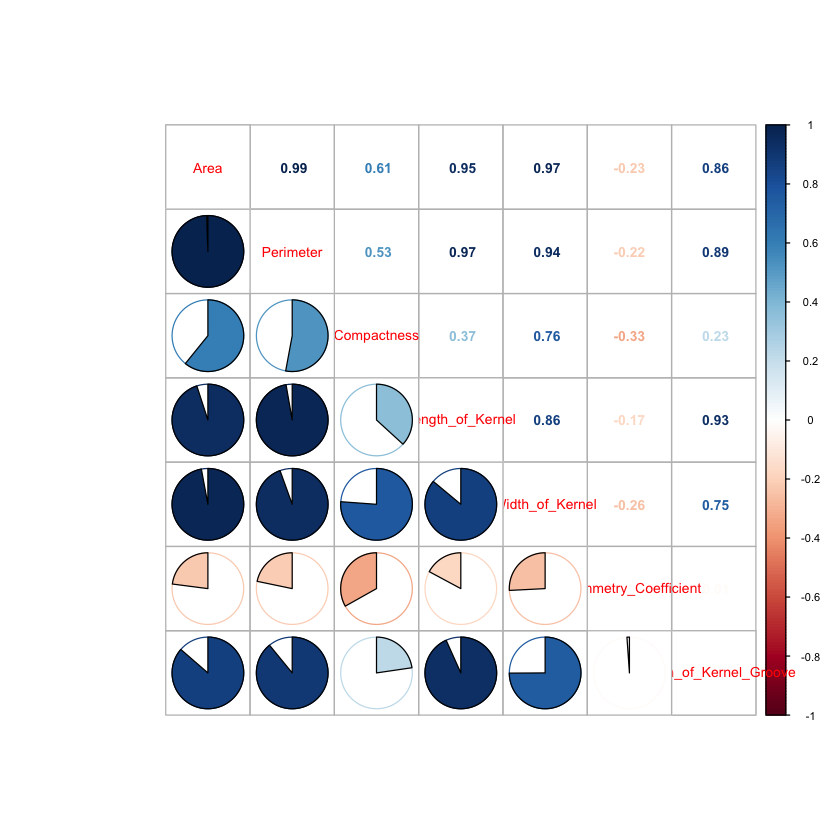

In [5]:
par(cex = 0.7) 

corrplot.mixed(corr, lower="pie", upper="number")


This plot is a correlation matrix displaying relationships between various variables.

There are strong positive correlations between several variables. For instance, Area and Perimeter show a very high positive correlation (0.99). Similarly, Area and Length_of_Kernel (0.97), and Perimeter and Length_of_Kernel (0.97) are strongly correlated. Additionally, Width_of_Kernel and Length_of_Kernel_Groove exhibit a strong positive correlation (0.93).

In contrast, some variables show negative correlations. Asymmetry_Coefficient and Length_of_Kernel have a moderate negative correlation (-0.33). Weaker negative correlations exist between Asymmetry_Coefficient and Width_of_Kernel (-0.26) and between Asymmetry_Coefficient and Area (-0.23).

Certain variables exhibit low correlations. Compactness generally shows low correlations with other variables. Similarly, Length_of_Kernel_Groove has low correlations with many variables.

Overall, Area, Perimeter, Length_of_Kernel, and Width_of_Kernel are significantly correlated, indicating common trends and patterns.

      Area         Perimeter      Compactness     Length_of_Kernel
 Min.   :10.59   Min.   :12.41   Min.   :0.8081   Min.   :4.899   
 1st Qu.:12.27   1st Qu.:13.45   1st Qu.:0.8569   1st Qu.:5.262   
 Median :14.36   Median :14.32   Median :0.8734   Median :5.524   
 Mean   :14.85   Mean   :14.56   Mean   :0.8710   Mean   :5.629   
 3rd Qu.:17.30   3rd Qu.:15.71   3rd Qu.:0.8878   3rd Qu.:5.980   
 Max.   :21.18   Max.   :17.25   Max.   :0.9183   Max.   :6.675   
 Width_of_Kernel Asymmetry_Coefficient Length_of_Kernel_Groove
 Min.   :2.630   Min.   :0.7651        Min.   :4.519          
 1st Qu.:2.944   1st Qu.:2.5615        1st Qu.:5.045          
 Median :3.237   Median :3.5990        Median :5.223          
 Mean   :3.259   Mean   :3.7002        Mean   :5.408          
 3rd Qu.:3.562   3rd Qu.:4.7687        3rd Qu.:5.877          
 Max.   :4.033   Max.   :8.4560        Max.   :6.550          

Area               Perimeter             Compactness 
             2.90969943              1.30595873              0.02362942 
       Length_of_Kernel         Width_of_Kernel   Asymmetry_Coefficient 
             0.44306348              0.37771444              1.50355713 
Length_of_Kernel_Groove 
             0.49148050

No id variables; using all as measure variables




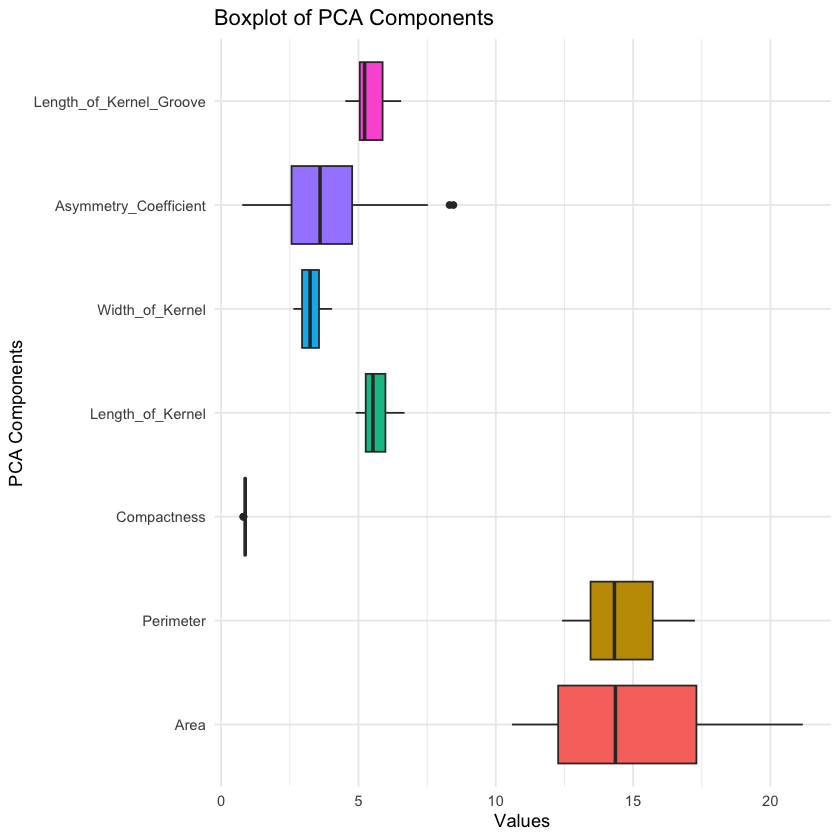

In [6]:
summary(seeds_pca)
apply(seeds_pca,2,sd)

seeds_pca_long <- melt(seeds_pca)

# Boxplot oluştur
ggplot(seeds_pca_long, aes(x = variable, y = value, fill = variable)) +
  geom_boxplot() +
  coord_flip() +  # Grafiği yatay yapmak için
  labs(title = "Boxplot of PCA Components",
       x = "PCA Components",
       y = "Values") +
  theme_minimal()+
  theme(legend.position = "none")

This boxplot displays the distribution of PCA components for different features of wheat kernels. The range of the Area feature spans from 10.59 to 21.18, with a median value of 14.36, indicating significant variability in the kernel areas. Similarly, the Perimeter feature shows a range from 12.41 to 17.25, and a median of 14.32, reflecting consistent but slightly less variability compared to the area.

The Compactness feature has a narrower range, from 0.8081 to 0.9183, and a median of 0.8734, suggesting high consistency among the samples. In contrast, the Length of Kernel ranges from 4.899 to 6.675, with a median of 5.524, and the Width of Kernel ranges from 2.630 to 4.033, with a median of 3.237, both showing moderate variability.

The Asymmetry Coefficient displays the widest range, from 0.7651 to 8.456, with a median of 3.599, indicating substantial variability. Finally, the Length of Kernel Groove ranges from 4.519 to 6.550, with a median value of 5.223, highlighting moderate variability.

In [7]:
stat.desc(seeds_pca)

,Area,Perimeter,Compactness,Length_of_Kernel,Width_of_Kernel,Asymmetry_Coefficient,Length_of_Kernel_Groove
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
nbr.val,210.0000000,2.100000e+02,2.100000e+02,2.100000e+02,210.00000000,210.0000000,2.100000e+02
nbr.null,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00,0.00000000,0.0000000,0.000000e+00
nbr.na,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00,0.00000000,0.0000000,0.000000e+00
min,10.5900000,1.241000e+01,8.081000e-01,4.899000e+00,2.63000000,0.7651000,4.519000e+00
max,21.1800000,1.725000e+01,9.183000e-01,6.675000e+00,4.03300000,8.4560000,6.550000e+00
range,10.5900000,4.840000e+00,1.102000e-01,1.776000e+00,1.40300000,7.6909000,2.031000e+00
sum,3117.9800000,3.057450e+03,1.829097e+02,1.181992e+03,684.30700000,777.0422000,1.135695e+03
median,14.3550000,1.432000e+01,8.734500e-01,5.523500e+00,3.23700000,3.5990000,5.223000e+00
mean,14.8475238,1.455929e+01,8.709986e-01,5.628533e+00,3.25860476,3.7002010,5.408071e+00


The given descriptive statistics indicate significant variability among the features, as seen in the differing ranges, means, and standard deviations. For example, Area has a range of 10.59 to 21.18 and a standard deviation of 2.91, while Compactness has a much smaller range of 0.8081 to 0.9183 and a standard deviation of 0.0236. These differences in scale can heavily influence the results of PCA. Therefore, due to this imbalance in the data, it is crucial to standardize the data before performing PCA. By scaling the data to have zero mean and unit variance, or performing PCA based on the correlation matrix, each feature is ensured to contribute equally to the analysis. This approach allows PCA to correctly identify the principal components based on the true underlying structure, rather than being dominated by features with larger scales.

Zorunlu paket yükleniyor: seeds_pca



Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :

“there is no package called ‘seeds_pca’”


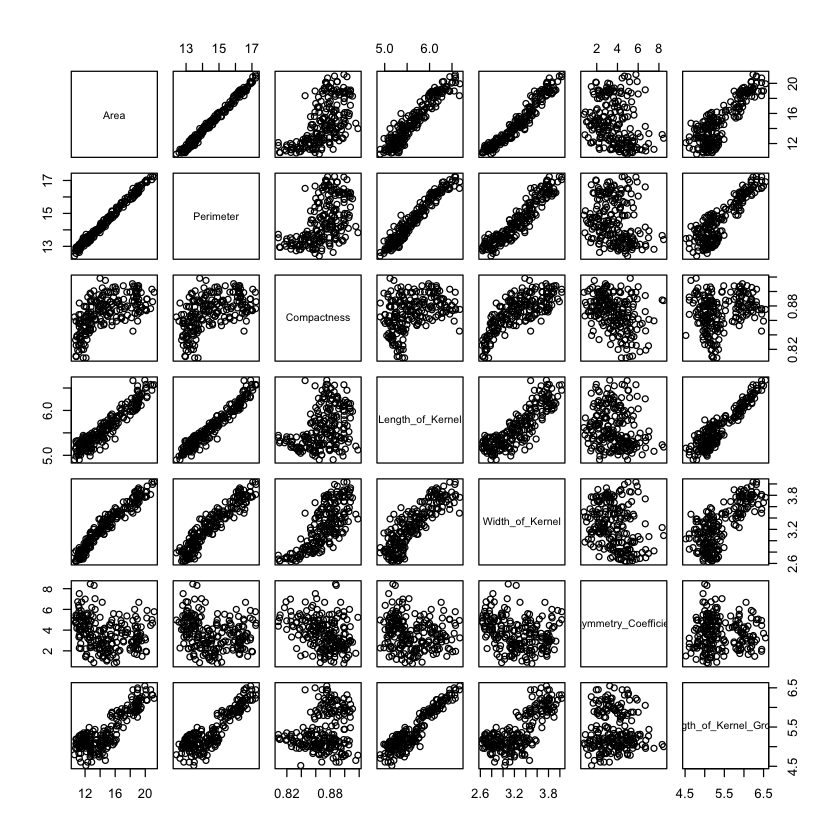

In [8]:
require(seeds_pca)
pairs(seeds_pca)

This plot is a scatter plot matrix showing pairwise relationships between different variables.

In the plot, Area and Perimeter have a strong positive correlation, indicated by the linear pattern. Similarly, Length_of_Kernel and Width_of_Kernel show a positive relationship, reflecting that as kernel length increases, the width also increases.

Asymmetry_Coefficient and Compactness display weaker relationships with other variables, as indicated by the lack of clear patterns.

Overall, this scatter plot matrix helps visualize pairwise relationships and distributions, aiding in understanding the data structure and identifying potential correlations.

In [9]:
data.cor <- cor(seeds_pca)
data.eigen <- eigen(data.cor)
data.eigen

eigen() decomposition
$values
[1] 5.0312011860 1.1975728470 0.6780034386 0.0683644770 0.0187136090
[6] 0.0053320457 0.0008123968

$vectors
           [,1]        [,2]        [,3]        [,4]        [,5]        [,6]
[1,] -0.4444735  0.02656355 -0.02587094  0.19363997 -0.20441167 -0.42643686
[2,] -0.4415715  0.08400282  0.05983912  0.29545659 -0.17427591 -0.47623853
[3,] -0.2770174 -0.52915125 -0.62969178 -0.33281640  0.33265481 -0.14162884
[4,] -0.4235633  0.20597518  0.21187966  0.26340659  0.76609839  0.27357647
[5,] -0.4328187 -0.11668963 -0.21648338  0.19963039 -0.46536555  0.70301171
[6,]  0.1186925  0.71688203 -0.67950584  0.09246481  0.03625822 -0.01964186
[7,] -0.3871608  0.37719327  0.21389720 -0.80414995 -0.11134657  0.04282974
             [,7]
[1,]  0.734805689
[2,] -0.670751532
[3,] -0.072552703
[4,]  0.046276051
[5,] -0.039289079
[6,] -0.003723456
[7,] -0.034498098


# PCA

## PCA BASED ON VARIANCE-COVARIANCE MATRIX

In [10]:
data.pca <- prcomp(seeds_pca)
summary(data.pca)

Importance of components:
                          PC1    PC2     PC3     PC4     PC5     PC6      PC7
Standard deviation     3.2853 1.4593 0.27135 0.11352 0.05242 0.03963 0.005446
Proportion of Variance 0.8294 0.1636 0.00566 0.00099 0.00021 0.00012 0.000000
Cumulative Proportion  0.8294 0.9930 0.99868 0.99967 0.99988 1.00000 1.000000

In [11]:
(data.pca$sdev)^2 

[1] 1.079333e+01 2.129455e+00 7.363003e-02 1.288749e-02 2.748227e-03
[6] 1.570450e-03 2.965544e-05

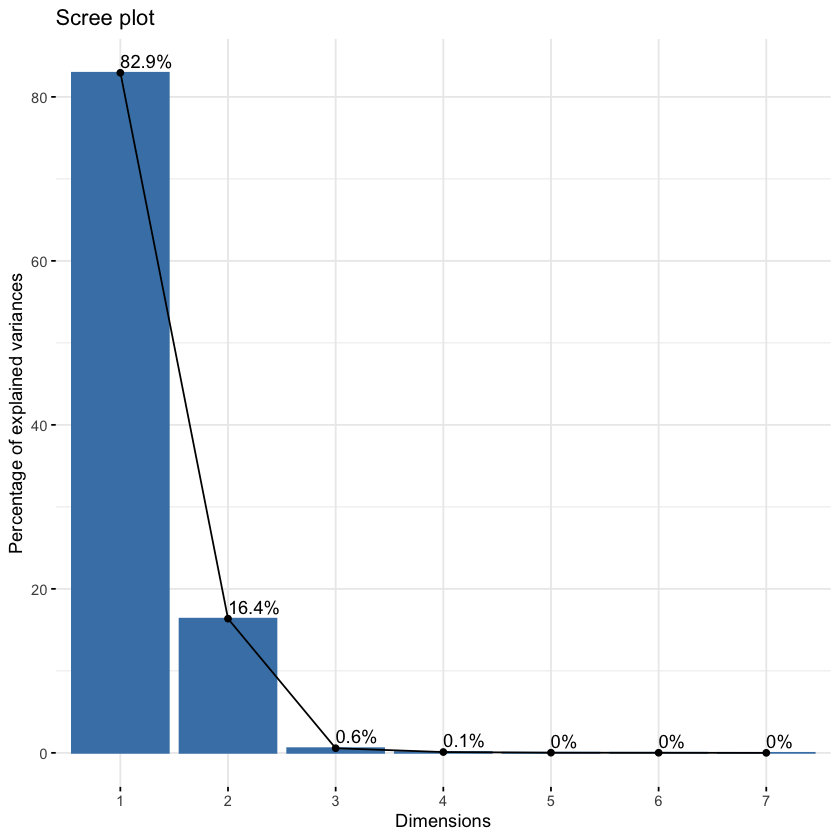

In [12]:
fviz_eig(data.pca, addlabels = TRUE)

The scree plot and the importance of components table clearly show that the first principal component (PC1) explains 82.9% of the variance in the data, with the second principal component (PC2) contributing an additional 16.4%. Together, these two components capture 99.3% of the total variance. This significant proportion indicates that using two dimensions is sufficient for capturing most of the information in the dataset. The remaining components each explain less than 1% of the variance, further supporting the decision to focus on the first two principal components for analysis. Therefore, PC1 and PC2 should be considered adequate for representing the data effective

In [13]:
# Results for Variables
res.var <- get_pca_var(data.pca)
res.var$coord          # Coordinates
res.var$contrib        # Contributions to the PCs

,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,-2.90497351,0.147102366,0.07178079,0.022642125,-7.191092e-03,0.0111214372,-1.383107e-04
Perimeter,-1.29903329,0.082433348,-0.07666138,-0.065709086,3.013074e-02,-0.0119504374,3.585431e-04
Compactness,-0.01416408,-0.004224199,0.01601929,0.006557120,-2.783927e-03,-0.0017923777,5.413691e-03
Length_of_Kernel,-0.42230973,0.044685229,-0.10857997,-0.049507452,-4.125720e-02,-0.0044954076,7.795137e-06
Width_of_Kernel,-0.36486480,0.003461804,0.08662495,0.026582977,-7.591079e-03,-0.0355181097,-4.440947e-04
Asymmetry_Coefficient,0.41925815,1.443812341,0.01744704,-0.002854807,-8.260058e-05,0.0001302997,6.222739e-06
Length_of_Kernel_Groove,-0.42369621,0.120000333,-0.20675124,0.069630143,4.595112e-03,-0.0043561532,4.885825e-05


,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,78.186004821,1.016180e+00,6.9977994,3.97800980,1.881642e+00,7.875856127,6.450705e-02
Perimeter,15.634544357,3.191078e-01,7.9817523,33.50289577,3.303445e+01,9.093761199,4.334893e-01
Compactness,0.001858752,8.379541e-04,0.3485230,0.33362439,2.820092e-01,0.204566735,9.882858e+01
Length_of_Kernel,1.652368290,9.376904e-02,16.0119593,19.01834205,6.193655e+01,1.286809037,2.049005e-04
Width_of_Kernel,1.233413236,5.627772e-04,10.1913339,5.48325843,2.096788e+00,80.329605086,6.650386e-01
Asymmetry_Coefficient,1.628574749,9.789331e+01,0.4134174,0.06323899,2.482639e-04,0.001081093,1.305746e-04
Length_of_Kernel_Groove,1.663235797,6.762331e-01,58.0552148,37.62063056,7.683155e-01,1.208320724,8.049546e-03


,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,8.4388711058,2.163911e-02,0.0051524820,5.126658e-04,5.171180e-05,1.236864e-04,1.912985e-08
Perimeter,1.6874874848,6.795257e-03,0.0058769668,4.317684e-03,9.078615e-04,1.428130e-04,1.285532e-07
Compactness,0.0002006211,1.784386e-05,0.0002566176,4.299583e-05,7.750251e-06,3.212618e-06,2.930805e-05
Length_of_Kernel,0.1783455114,1.996770e-03,0.0117896109,2.450988e-03,1.702157e-03,2.020869e-05,6.076416e-11
Width_of_Kernel,0.1331263228,1.198409e-05,0.0075038825,7.066546e-04,5.762449e-05,1.261536e-03,1.972201e-07
Asymmetry_Coefficient,0.1757773967,2.084594e+00,0.0003043994,8.149921e-06,6.822856e-09,1.697802e-08,3.872248e-11
Length_of_Kernel_Groove,0.1795184770,1.440008e-02,0.0427460738,4.848357e-03,2.111505e-05,1.897607e-05,2.387129e-09


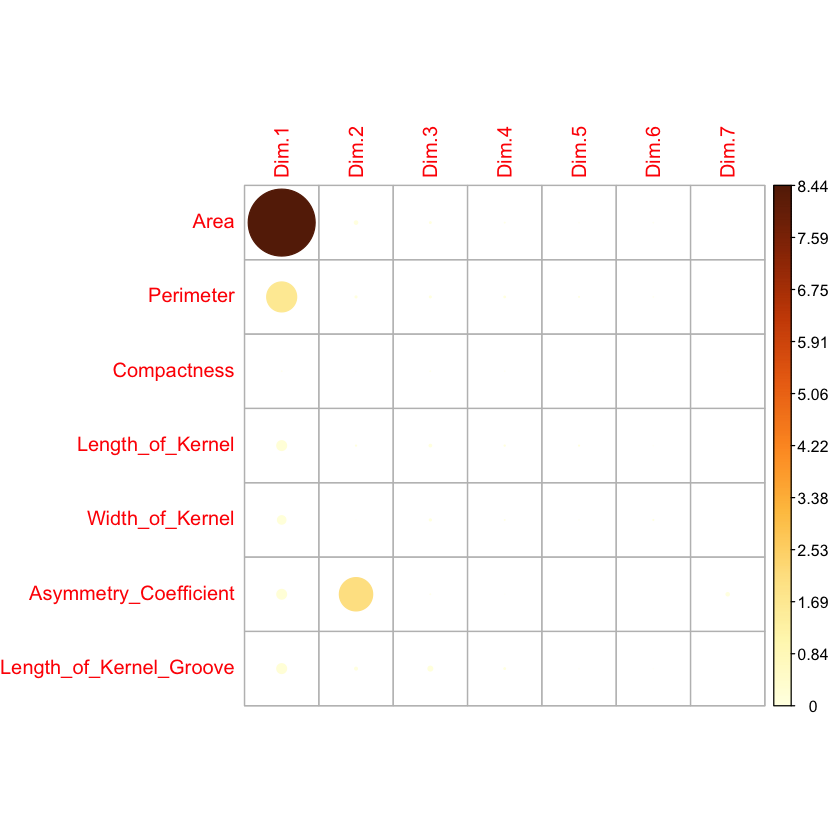

In [14]:
res.var$cos2           # Quality of representation 
corrplot(res.var$cos2, is.corr=FALSE) # Quality of representation 

The given matrix of contributions highlights significant discrepancies in how well different variables are represented in the principal components. For instance, 'Area' and 'Perimeter' contribute heavily to the first principal component (PC1), whereas 'Asymmetry_Coefficient' is predominantly represented in the second principal component (PC2). However, variables such as 'Compactness' and 'Width_of_Kernel' exhibit minimal contributions across the principal components, suggesting that these variables are not well represented in the reduced dimensional space. This uneven representation indicates that while some variables are captured effectively, others are not adequately accounted for, leading to a potentially incomplete understanding of the data structure.

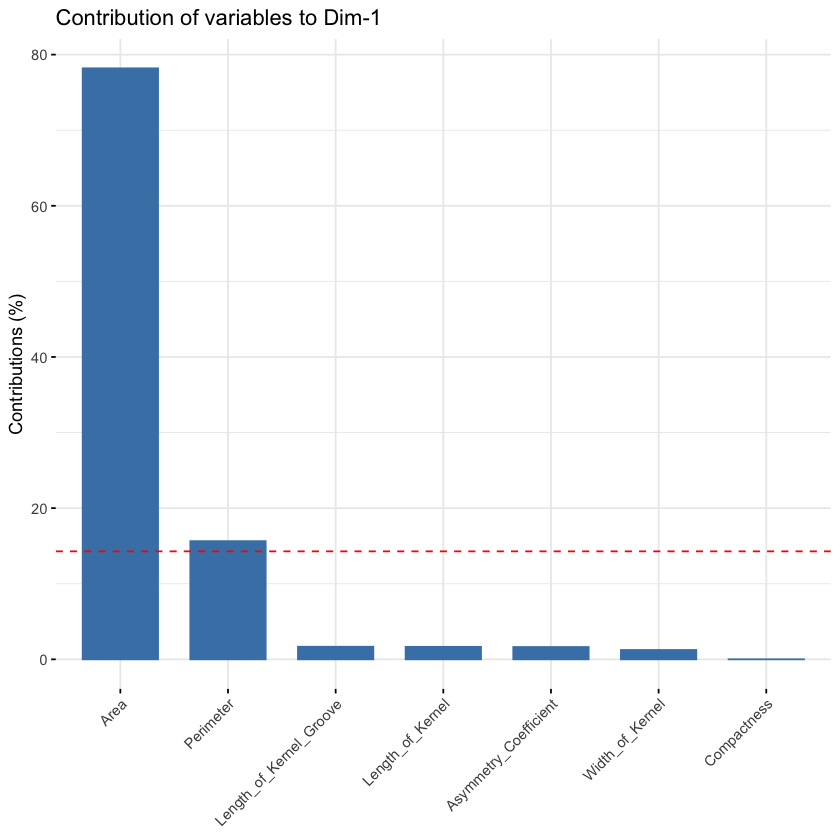

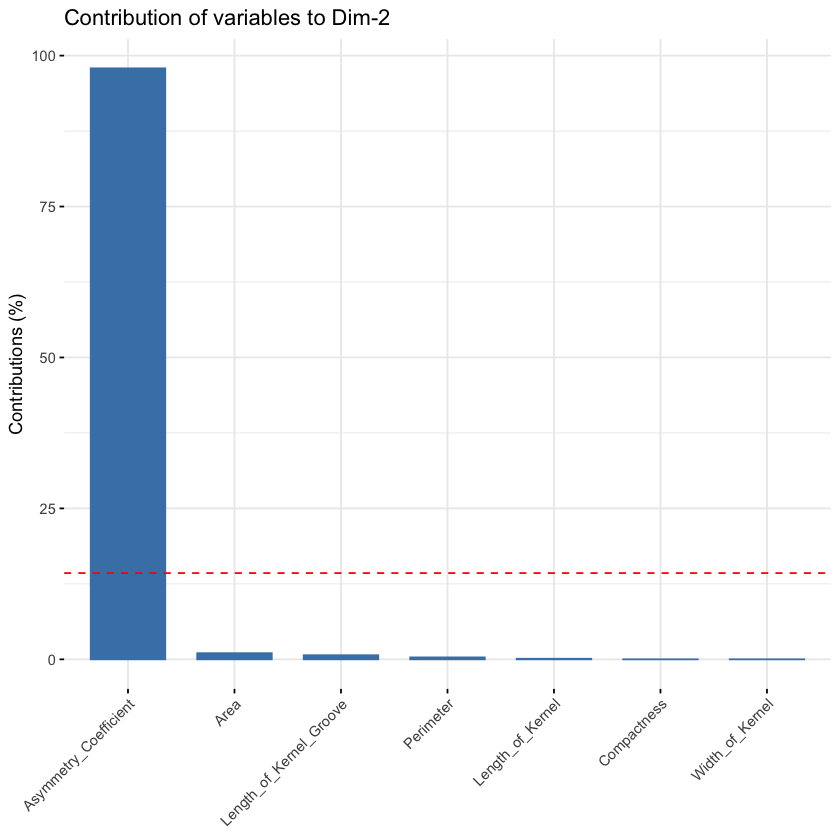

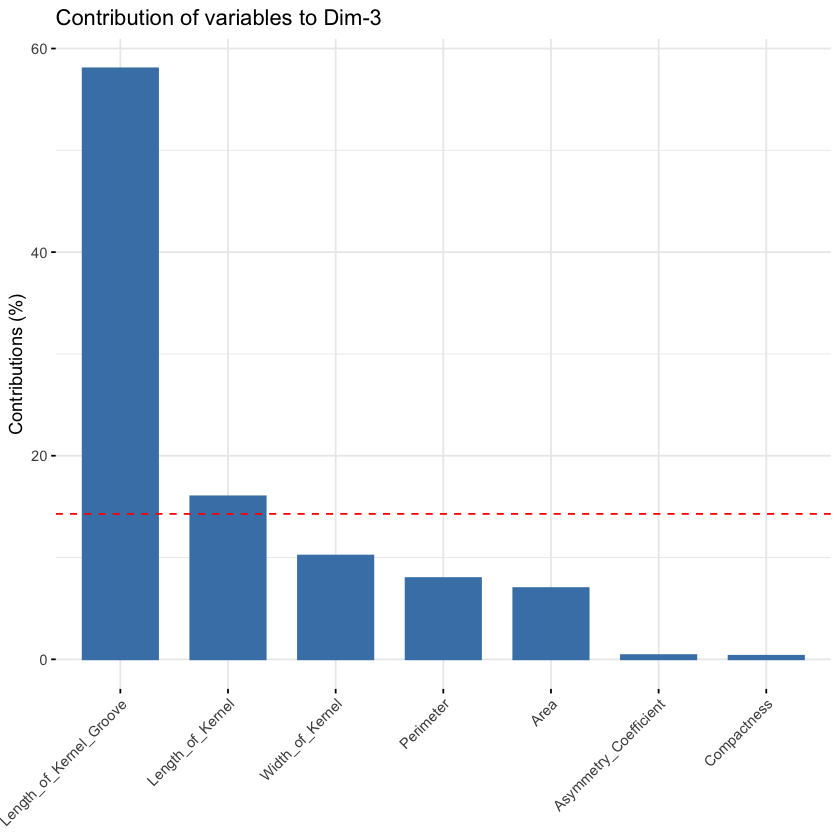

In [15]:
  # Contributions of variables to PC1
fviz_contrib(data.pca, choice = "var", axes = 1, top = 7)
# Contributions of variables to PC2
fviz_contrib(data.pca, choice = "var", axes = 2, top = 7)
fviz_contrib(data.pca, choice = "var", axes = 3, top = 7)

The variable contribution plots for the first three dimensions strongly support the previous assertion that not all variables are well represented in the PCA analysis. In Dim-1, the "Area" variable overwhelmingly dominates, contributing around 80% to this dimension. Similarly, for Dim-2, "Asymmetry_Coefficient" contributes nearly 100%, indicating a high dependency on just one variable. In Dim-3, "Length_of_Kernel_Groove" stands out with a significant contribution of around 60%. These plots confirm that most variables do not contribute significantly across the first three dimensions, which aligns with the earlier observation of poor representation in the variance-covariance matrix analysis. This uneven contribution distribution highlights the need for careful consideration when selecting variables for PCA to ensure a more balanced and comprehensive representation.

## PCA ON SCALED DATA

In [16]:
data.pca <- prcomp(seeds_pca, center = TRUE, scale. = TRUE)
summary(data.pca)

Importance of components:
                          PC1    PC2     PC3     PC4     PC5     PC6     PC7
Standard deviation     2.2430 1.0943 0.82341 0.26147 0.13680 0.07302 0.02850
Proportion of Variance 0.7187 0.1711 0.09686 0.00977 0.00267 0.00076 0.00012
Cumulative Proportion  0.7187 0.8898 0.98668 0.99645 0.99912 0.99988 1.00000

In [17]:
(data.pca$sdev)^2 ##özdeğerler

[1] 5.0312011860 1.1975728470 0.6780034386 0.0683644770 0.0187136090
[6] 0.0053320457 0.0008123968

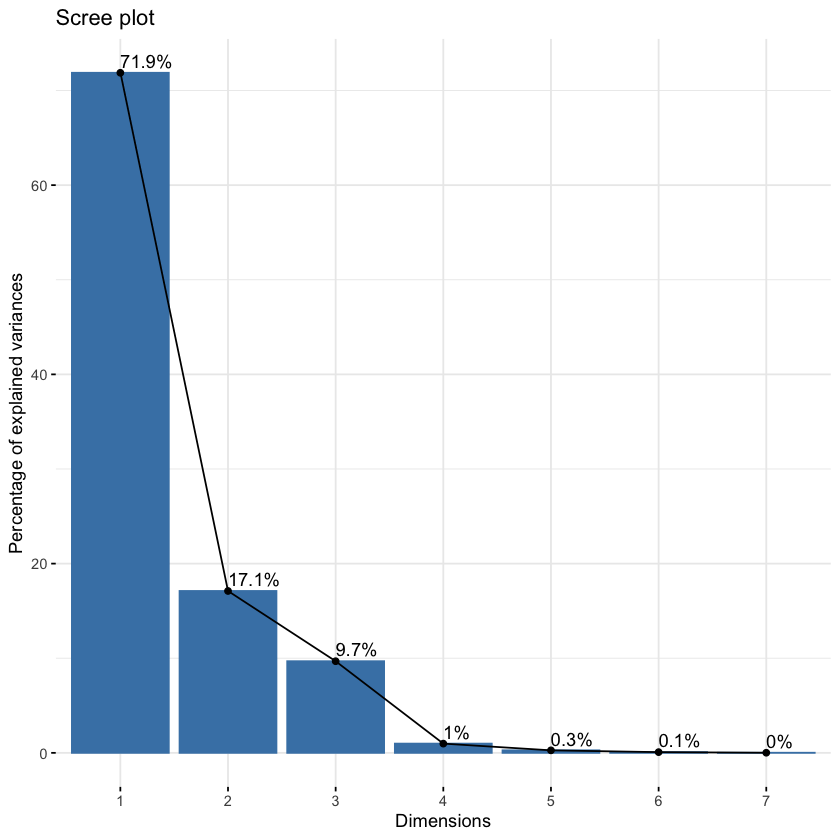

In [18]:
fviz_eig(data.pca, addlabels = TRUE)

The scree plot and eigenvalues indicate that two dimensions are suggested due to their eigenvalues being above 1. Although a single dimension already captures a very high cumulative proportion of variance (71.9%), making it highly effective on its own, the second dimension further increases the cumulative proportion to 88.98%. The third dimension, despite having an eigenvalue below 1, explains 9.7% of the variance, which is not negligible. Typically, a two-dimensional PCA is recommended. However, for the purpose of this study, K-means clustering will be applied and evaluated on all three dimensions separately to test their performanc

In [19]:
# Eigenvalues
eig.val <- get_eigenvalue(data.pca)
eig.val

,eigenvalue,variance.percent,cumulative.variance.percent
,<dbl>,<dbl>,<dbl>
Dim.1,5.0312011860,71.87430266,71.87430
Dim.2,1.1975728470,17.10818353,88.98249
Dim.3,0.6780034386,9.68576341,98.66825
Dim.4,0.0683644770,0.97663539,99.64488
Dim.5,0.0187136090,0.26733727,99.91222
Dim.6,0.0053320457,0.07617208,99.98839
Dim.7,0.0008123968,0.01160567,100.00000


The eigenvalues indicate that PCA can be considered up to PC2, as the first two principal components have eigenvalues greater than 1, capturing most of the variance. The cumulative proportion shows that even a single dimension (PC1) captures over 80% of the variance, suggesting that PC1 alone might be sufficient. However, to explore the impact of different numbers of dimensions on the model, this notebook will evaluate the effects of using one, two, and three dimensions separately.

In [20]:
# Results for Variables
res.var <- get_pca_var(data.pca)
res.var$coord          # Coordinates
res.var$contrib        # Contributions to the PCs


,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,-0.9969692,-0.02906947,0.02130238,0.05063027,-0.02796304,-0.031138785,-0.0209438545
Perimeter,-0.9904598,-0.09192737,-0.04927210,0.07725186,-0.02384054,-0.034775346,0.0191181460
Compactness,-0.6213594,0.57906965,0.51849428,-0.08702018,0.04550641,-0.010341859,0.0020679389
Length_of_Kernel,-0.9500669,-0.22540620,-0.17446376,0.06887187,0.10480049,0.019976789,-0.0013189866
Width_of_Kernel,-0.9708269,0.12769775,0.17825451,0.05219656,-0.06366093,0.051334518,0.0011198399
Asymmetry_Coefficient,0.2662313,-0.78451032,0.55951166,0.02417641,0.00496004,-0.001434266,0.0001061281
Length_of_Kernel_Groove,-0.8684149,-0.41277645,-0.17612501,-0.21025788,-0.01523195,0.003127464,0.0009832846


,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,19.755671,0.07056223,0.06693054,3.7496439,4.1784130,18.18483930,53.993940071
Perimeter,19.498536,0.70564738,0.35807198,8.7294597,3.0372092,22.68031416,44.990761708
Compactness,7.673862,28.00010494,39.65117316,11.0766754,11.0659219,2.00587274,0.526389470
Length_of_Kernel,17.940589,4.24257759,4.48929913,6.9383034,58.6906744,7.48440869,0.214147288
Width_of_Kernel,18.733199,1.36164697,4.68650554,3.9852294,21.6565097,49.42254616,0.154363172
Asymmetry_Coefficient,1.408790,51.39198433,46.17281857,0.8549741,0.1314658,0.03858027,0.001386412
Length_of_Kernel_Groove,14.989352,14.22747656,4.57520109,64.6657141,1.2398059,0.18343867,0.119011879


,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7
Area,0.99394755,0.0008450341,0.0004537914,0.0025634244,0.0007819319,9.696239e-04,4.386450e-04
Perimeter,0.98101057,0.0084506414,0.0024277403,0.0059678495,0.0005683714,1.209325e-03,3.655035e-04
Compactness,0.38608745,0.3353216539,0.2688363174,0.0075725112,0.0020708334,1.069541e-04,4.276371e-06
Length_of_Kernel,0.90262715,0.0508079572,0.0304376025,0.0047433348,0.0109831433,3.990721e-04,1.739726e-06
Width_of_Kernel,0.94250493,0.0163067144,0.0317746687,0.0027244812,0.0040527146,2.635233e-03,1.254041e-06
Asymmetry_Coefficient,0.07087908,0.6154564499,0.3130532976,0.0005844986,0.0000246020,2.057118e-06,1.126317e-08
Length_of_Kernel_Groove,0.75414445,0.1703843961,0.0310200207,0.0442083772,0.0002320124,9.781033e-06,9.668487e-07


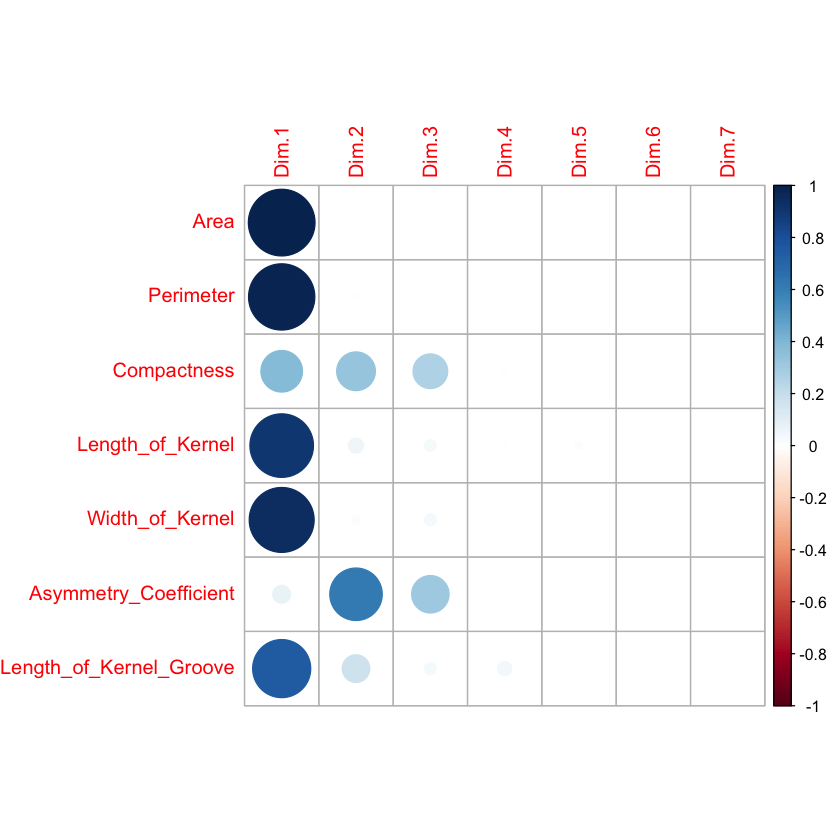

In [21]:
res.var$cos2           # Quality of representation 
corrplot(res.var$cos2, is.corr=TRUE) # Quality of representation 

This plot shows the quality of representation (cos2 values) of variables in PCA. The variables Area, Perimeter, Length_of_Kernel, and Width_of_Kernel have high cos2 values in Dim 1, indicating they are well represented by this component. Compactness and Asymmetry_Coefficient are better represented in Dim 2. This means these variables are strongly represented in the first two components of PCA and contribute less to the other components.

For the first two dimensions, it might be useful to name them based on the variables they represent:

Dim 1: Size Component (as it mainly represents Area, Perimeter, Length_of_Kernel, and Width_of_Kernel)
Dim 2: Shape Component (as it primarily represents Compactness and Asymmetry_Coefficient)

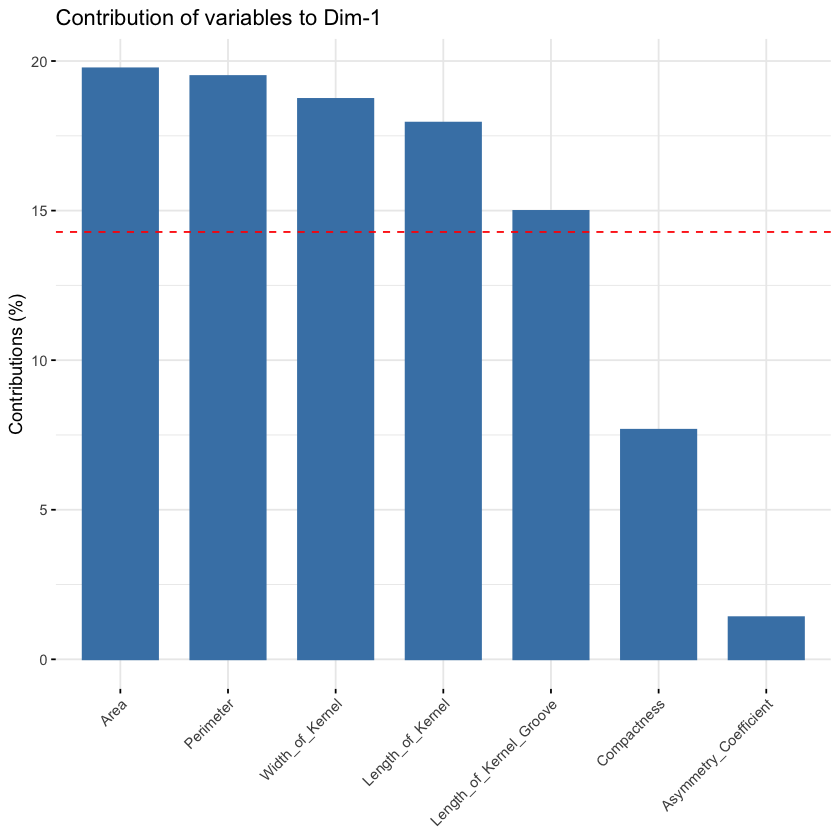

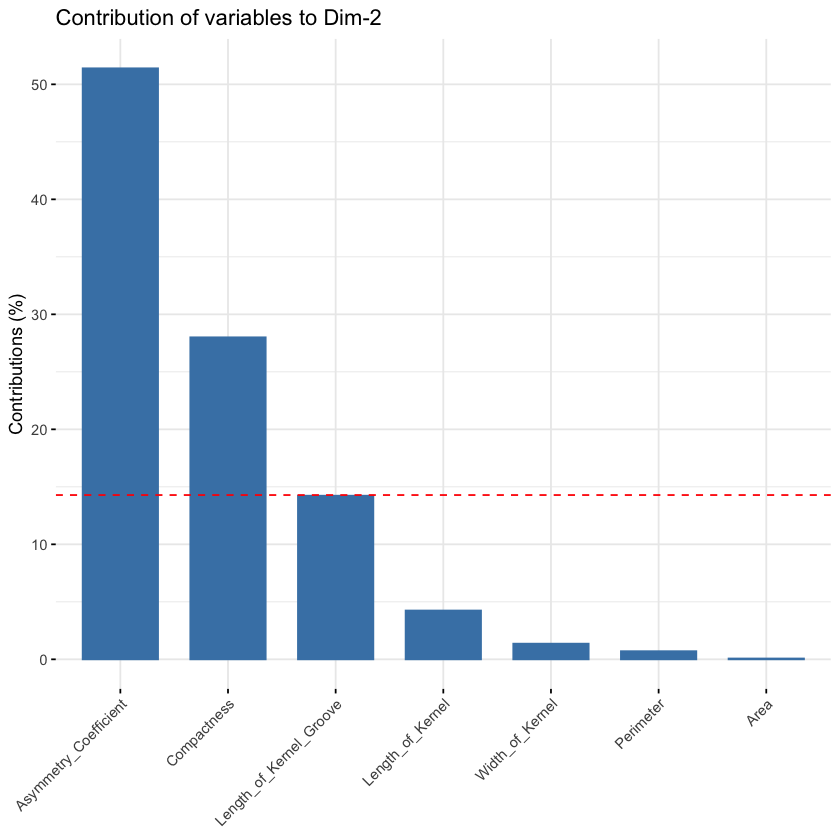

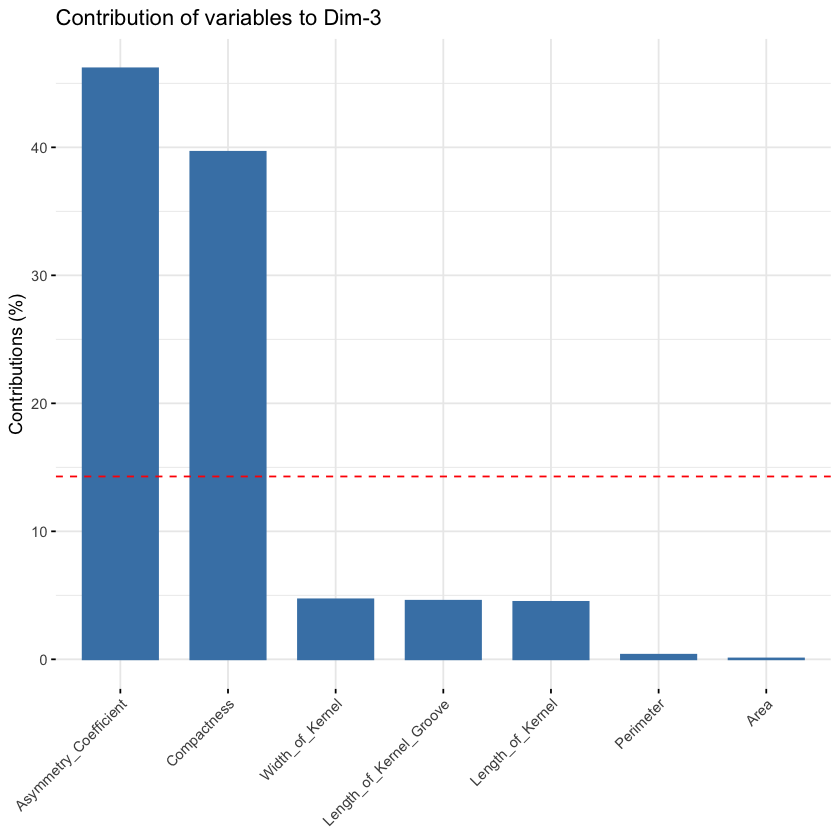

In [22]:
#Variable contributions to the principal axes:
  # Contributions of variables to PC1
fviz_contrib(data.pca, choice = "var", axes = 1, top = 7)
# Contributions of variables to PC2
fviz_contrib(data.pca, choice = "var", axes = 2, top = 7)
fviz_contrib(data.pca, choice = "var", axes = 3, top = 7)

These plots show the contributions of variables to the first three principal components (Dim-1, Dim-2, Dim-3) in PCA.

Dim-1: Area, Perimeter, Width_of_Kernel, Length_of_Kernel, and Length_of_Kernel_Groove make the highest contributions. This component represents these variables well and can explain a significant portion of the data variance.

Dim-2: Asymmetry_Coefficient and Compactness provide the highest contributions. This component primarily represents shape and asymmetry-related features.

Dim-3: Again, Asymmetry_Coefficient and Compactness have the highest contributions. This component, similar to the second one, represents shape and asymmetry features, but the contributions from other components are lower.

Overall, the first component mainly represents size and area-related features, while the second and third components represent shape and asymmetry features. This demonstrates how each PCA component highlights different data characteristics.

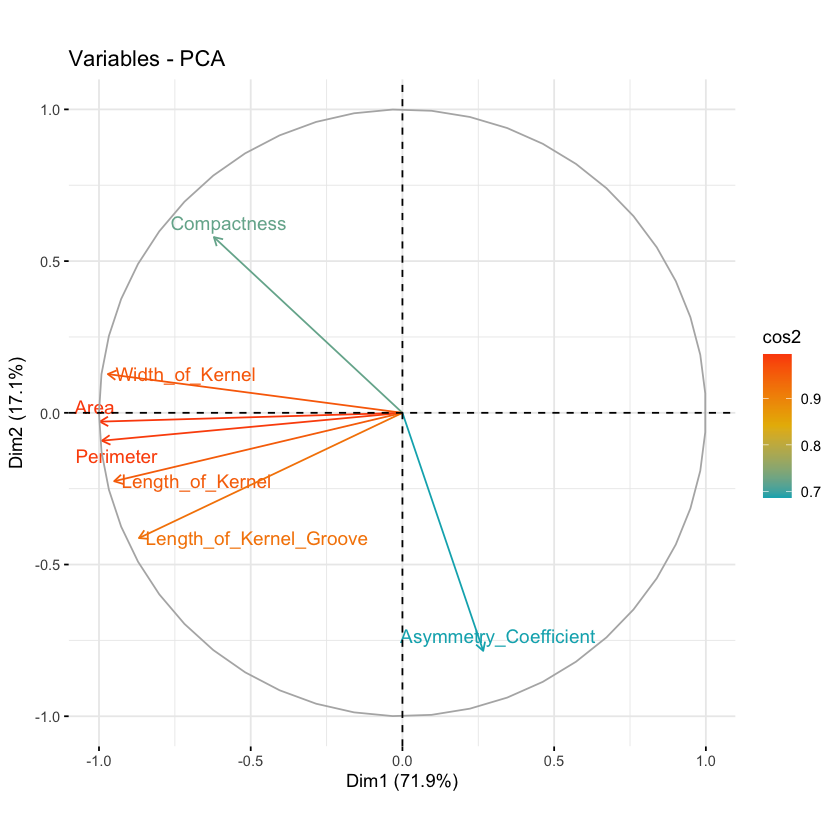

In [23]:
fviz_pca_var(data.pca, col.var = "cos2",
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"), 
             repel = TRUE # Avoid text overlapping
)


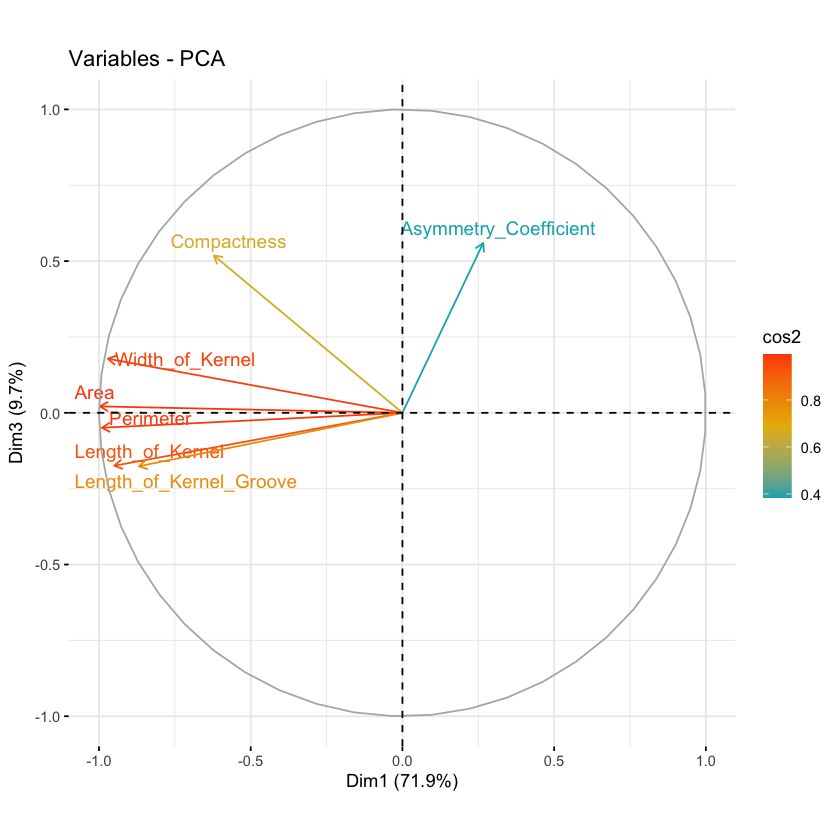

In [24]:
fviz_pca_var(data.pca, col.var = "cos2", axes=c(1,3),
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"), 
             repel = TRUE # Avoid text overlapping
)


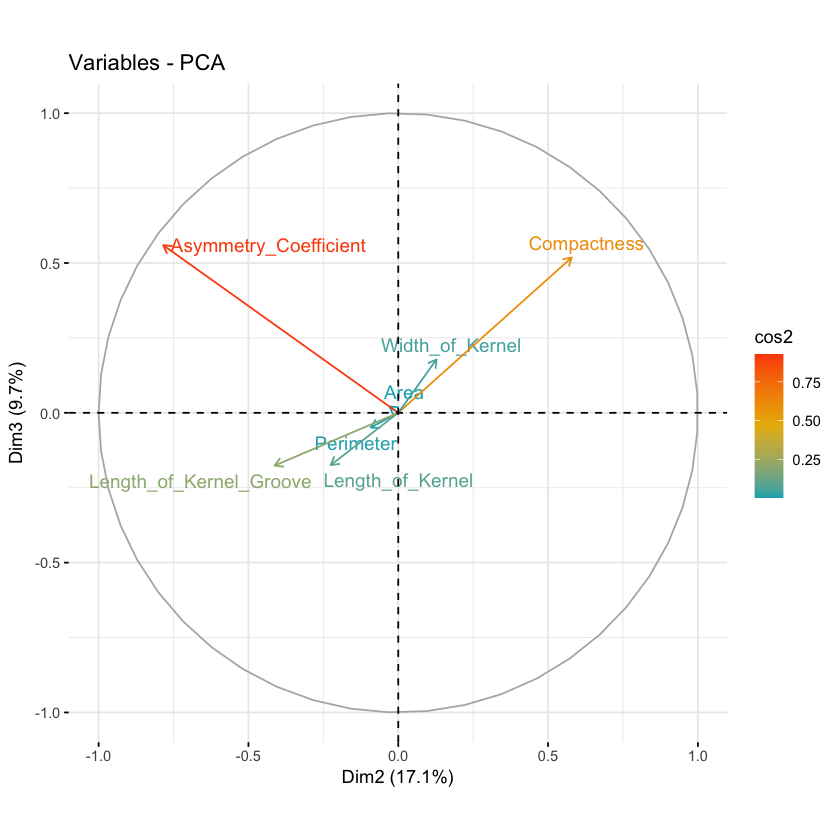

In [25]:
fviz_pca_var(data.pca, col.var = "cos2", axes=c(2,3),
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"), 
             repel = TRUE # Avoid text overlapping
)



The first plot shows that Dim1, which explains 71.9% of the variance, is heavily influenced by the variables Area, Perimeter, Width_of_Kernel, Length_of_Kernel, and Length_of_Kernel_Groove, all of which have high cos2 values indicating strong representation in this dimension.

The second plot illustrates that Dim2, accounting for 17.1% of the variance, is significantly influenced by the Asymmetry_Coefficient and Compactness variables. This indicates that these features are essential in defining Dim2.

The third plot reveals that Dim3, explaining 9.7% of the variance, is primarily driven by the Asymmetry_Coefficient and Compactness, similar to Dim2 but with different proportions of contribution, highlighting different aspects of these variables' influence on the data structure.

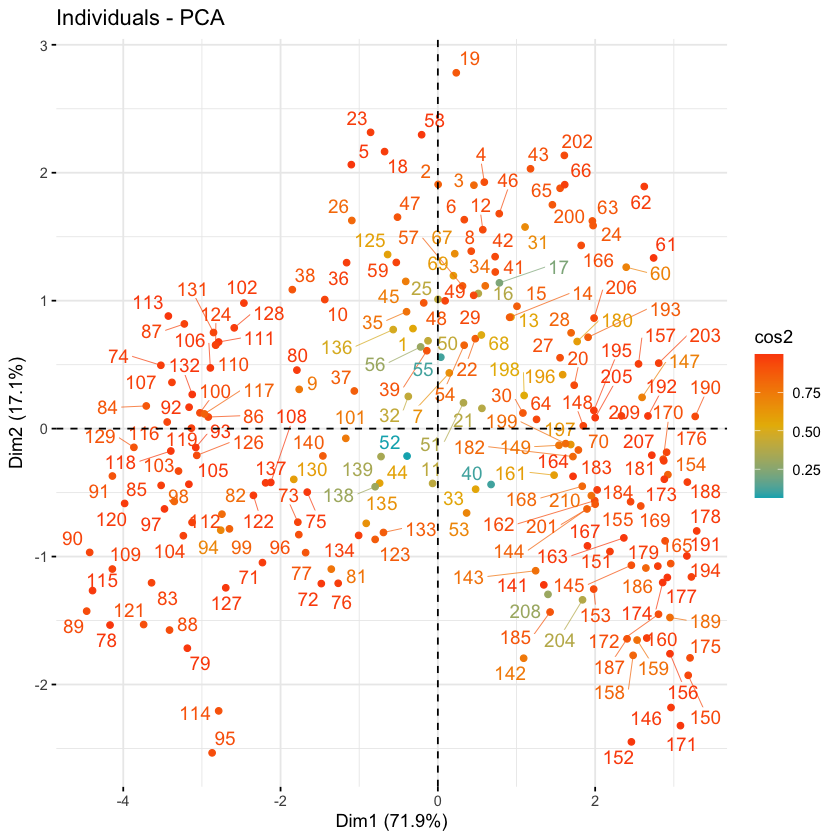

In [26]:
##Graph of individuals. Individuals with a similar profile are grouped together
fviz_pca_ind(data.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

This plot visualizes the individuals (data points) based on their scores on the first two principal components (Dim1 and Dim2), which account for 71.9% and 17.1% of the variance, respectively. Each point represents an individual kernel, with the color indicating the cos2 value, a measure of how well the point is represented by the selected dimensions. Red points have higher cos2 values, indicating a better representation in the first two dimensions, while yellow and blue points have lower cos2 values. The spread of points suggests distinct grouping patterns and variability among the wheat varieties.

In [27]:
seeds[95,]

,Area,Perimeter,Compactness,Length_of_Kernel,Width_of_Kernel,Asymmetry_Coefficient,Length_of_Kernel_Groove,Varieties_of_Wheat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
95,18.36,16.52,0.8452,6.666,3.485,4.933,6.448,1


In [28]:
summary(seeds)

      Area         Perimeter      Compactness     Length_of_Kernel
 Min.   :10.59   Min.   :12.41   Min.   :0.8081   Min.   :4.899   
 1st Qu.:12.27   1st Qu.:13.45   1st Qu.:0.8569   1st Qu.:5.262   
 Median :14.36   Median :14.32   Median :0.8734   Median :5.524   
 Mean   :14.85   Mean   :14.56   Mean   :0.8710   Mean   :5.629   
 3rd Qu.:17.30   3rd Qu.:15.71   3rd Qu.:0.8878   3rd Qu.:5.980   
 Max.   :21.18   Max.   :17.25   Max.   :0.9183   Max.   :6.675   
 Width_of_Kernel Asymmetry_Coefficient Length_of_Kernel_Groove
 Min.   :2.630   Min.   :0.7651        Min.   :4.519          
 1st Qu.:2.944   1st Qu.:2.5615        1st Qu.:5.045          
 Median :3.237   Median :3.5990        Median :5.223          
 Mean   :3.259   Mean   :3.7002        Mean   :5.408          
 3rd Qu.:3.562   3rd Qu.:4.7687        3rd Qu.:5.877          
 Max.   :4.033   Max.   :8.4560        Max.   :6.550          
 Varieties_of_Wheat
 0:70              
 1:70              
 2:70              
          

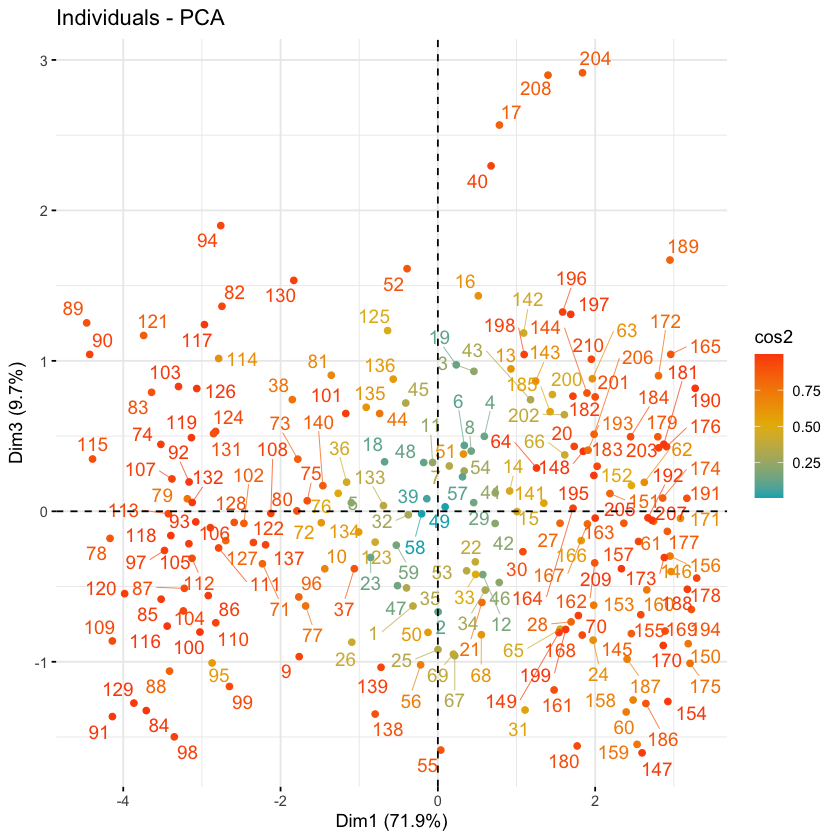

In [29]:
##Graph of individuals. Individuals with a similar profile are grouped together
fviz_pca_ind(data.pca,
             col.ind = "cos2",axes=c(1,3), # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

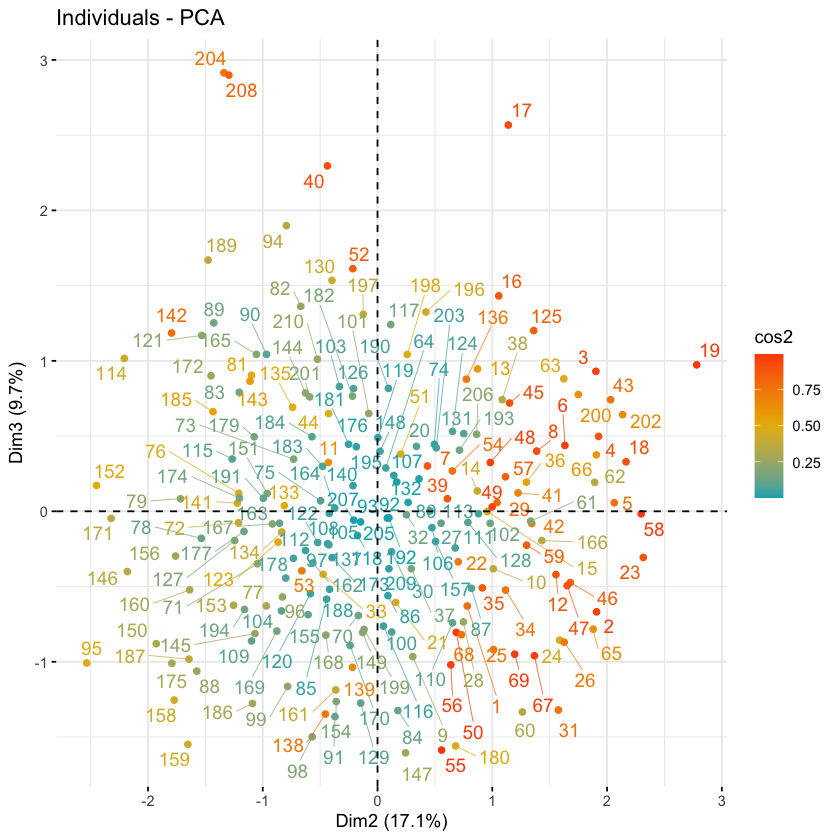

In [30]:
##Graph of individuals. Individuals with a similar profile are grouped together
fviz_pca_ind(data.pca,
             col.ind = "cos2",axes=c(2,3), # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

The PCA plots of individuals show data point distribution across the first three principal components, colored by their representation quality (cos2 values).

In both plots, red points have higher cos2 values, indicating better representation by the dimensions shown. Outliers like points 95 and 114 stand out, highlighting their unique characteristics compared to the main cluster.

Warning message in data.frame(PC1 = pca_data[, 1], PC2 = pca_data[, 2], PC3 = pca_data[, :

“row names were found from a short variable and have been discarded”


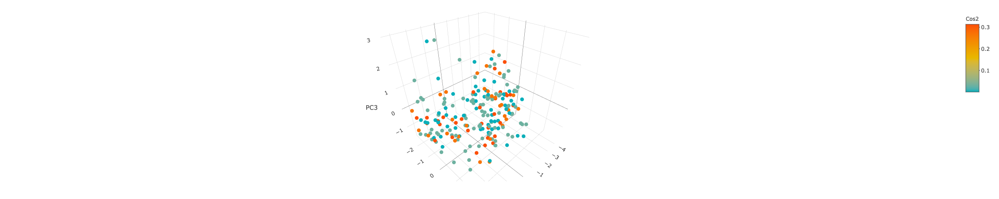

In [31]:
# Projected data onto PC1, PC2, and PC3
pca_data <- data.pca$x[, 1:3]  # Assuming pca_result is your PCA result object

# Get cos2 values
cos2_values <- get_pca_var(data.pca)$cos2

# Create a data frame for plotly
plot_data <- data.frame(PC1 = pca_data[, 1],
                         PC2 = pca_data[, 2],
                         PC3 = pca_data[, 3],
                         Cos2 = cos2_values[, 3])  # Assuming you want to use the first column of cos3

# Create 3D scatter plot with plotly
plot_ly(data = plot_data, 
        x = ~PC1, y = ~PC2, z = ~PC3, 
        color = ~Cos2, 
        colors = c("#00AFBB", "#E7B800", "#FC4E07"),  # You can adjust colors as desired
        type = "scatter3d", mode = "markers",
        marker = list(size = 5)) %>%
  layout(scene = list(xaxis = list(title = "PC1"),
                      yaxis = list(title = "PC2"),
                      zaxis = list(title = "PC3"),
                      aspectmode = "cube"))



This 3D PCA plot visualizes the data distribution along the first three principal components, colored by cos2 values. Higher cos2 values (red) indicate better representation of the data points by the selected principal components. The plot shows a central cluster with a few dispersed points, highlighting the variance in the dataset.

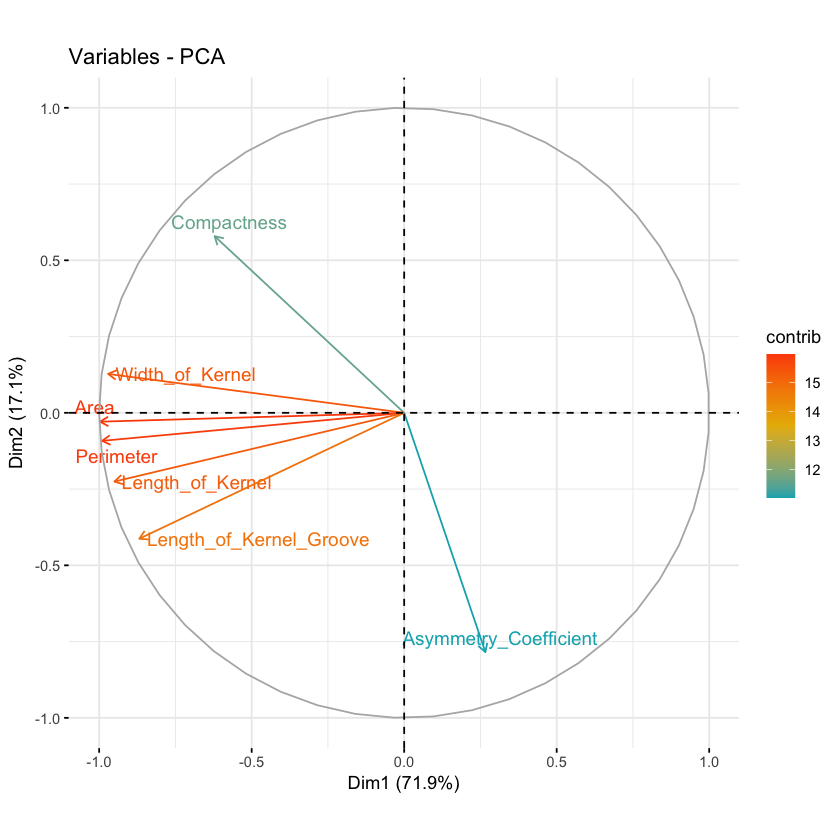

In [32]:
#Graph of variables. Positive correlated variables point to the same side of the plot. 
##Negative correlated variables point to opposite sides of the graph.
fviz_pca_var(data.pca,
             col.var = "contrib", # Color by contributions to the PC
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

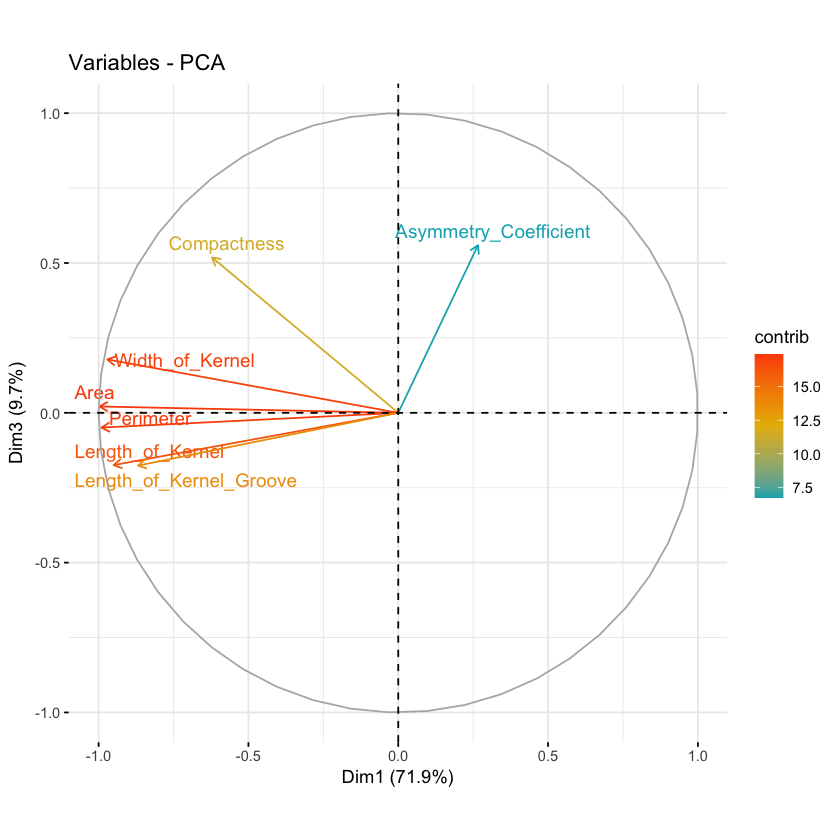

In [33]:
#Graph of variables. Positive correlated variables point to the same side of the plot. 
##Negative correlated variables point to opposite sides of the graph.
fviz_pca_var(data.pca, axes=c(1,3),
             col.var = "contrib", # Color by contributions to the PC
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

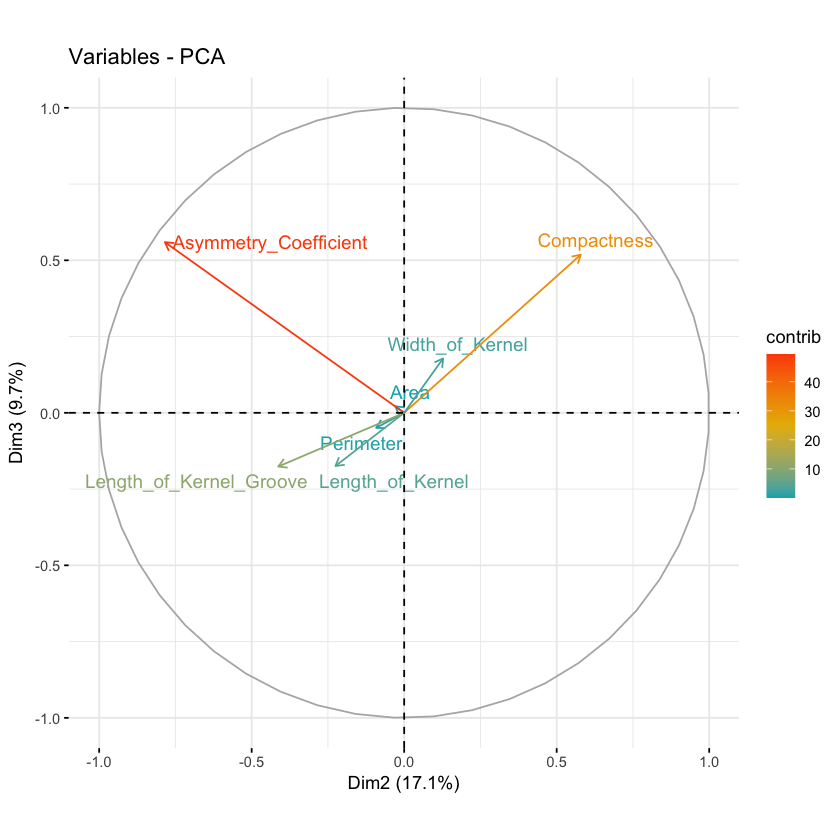

In [34]:
#Graph of variables. Positive correlated variables point to the same side of the plot. 
##Negative correlated variables point to opposite sides of the graph.
fviz_pca_var(data.pca, axes=c(2,3),
             col.var = "contrib", # Color by contributions to the PC
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
)

In the first graph, we see the variable contributions to Dimension 1 (Dim1) and Dimension 2 (Dim2) in the PCA. The variables 'Area,' 'Perimeter,' 'Width_of_Kernel,' 'Length_of_Kernel,' and 'Length_of_Kernel_Groove' contribute significantly to Dim1, while 'Compactness' and 'Asymmetry_Coefficient' contribute less. Dim1 captures 71.9% of the variance.

In the second graph, showing Dim1 and Dimension 3 (Dim3), the significant contributors to Dim3 are 'Asymmetry_Coefficient' and 'Compactness.' These variables have higher contribution values, indicating they are more important in explaining the variance captured by Dim3. Dim3 accounts for 9.7% of the variance.

The third graph, which plots Dim2 against Dim3, shows that 'Compactness' and 'Asymmetry_Coefficient' are the most significant contributors to Dim3. 'Area,' 'Perimeter,' and 'Length_of_Kernel' contribute less to these dimensions. This analysis highlights that 'Asymmetry_Coefficient' and 'Compactness' are important for explaining the variance in the data along Dim2 and Dim3, while Dim1 is heavily influenced by size-related variables like 'Area' and 'Perimeter.'

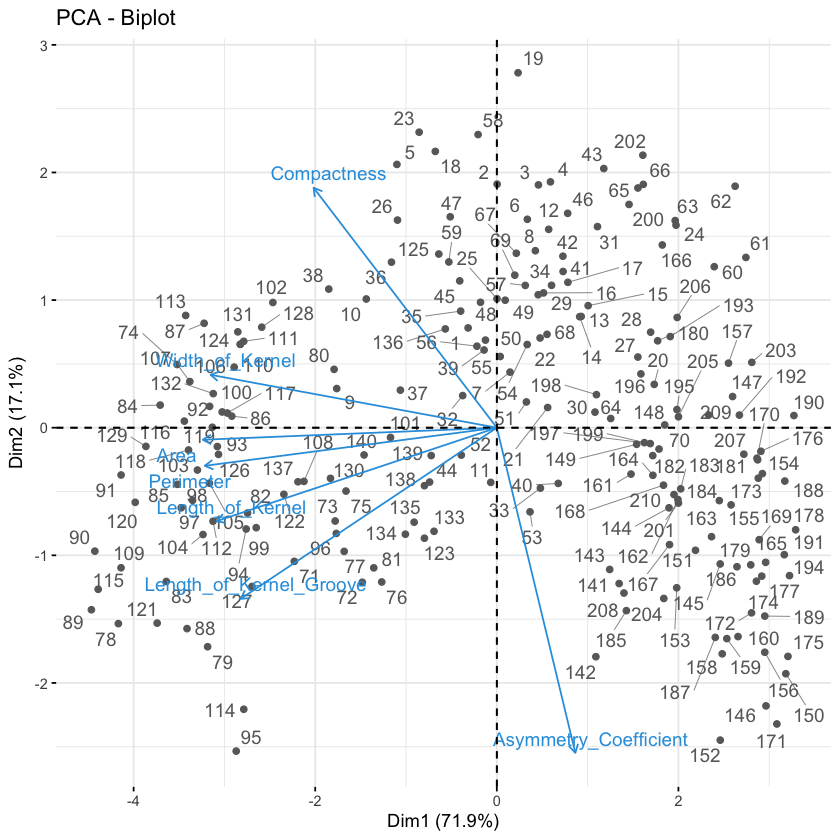

In [35]:
#Biplot of individuals and variables
fviz_pca_biplot(data.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
)

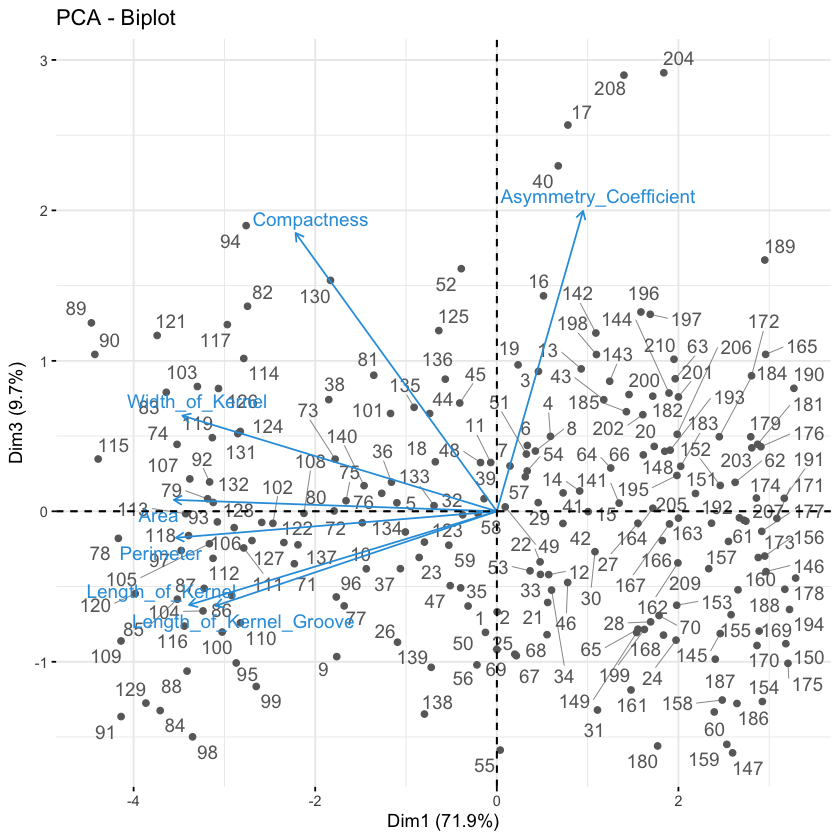

In [36]:
#Biplot of individuals and variables
fviz_pca_biplot(data.pca, repel = TRUE, axes=c(1,3),
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
)

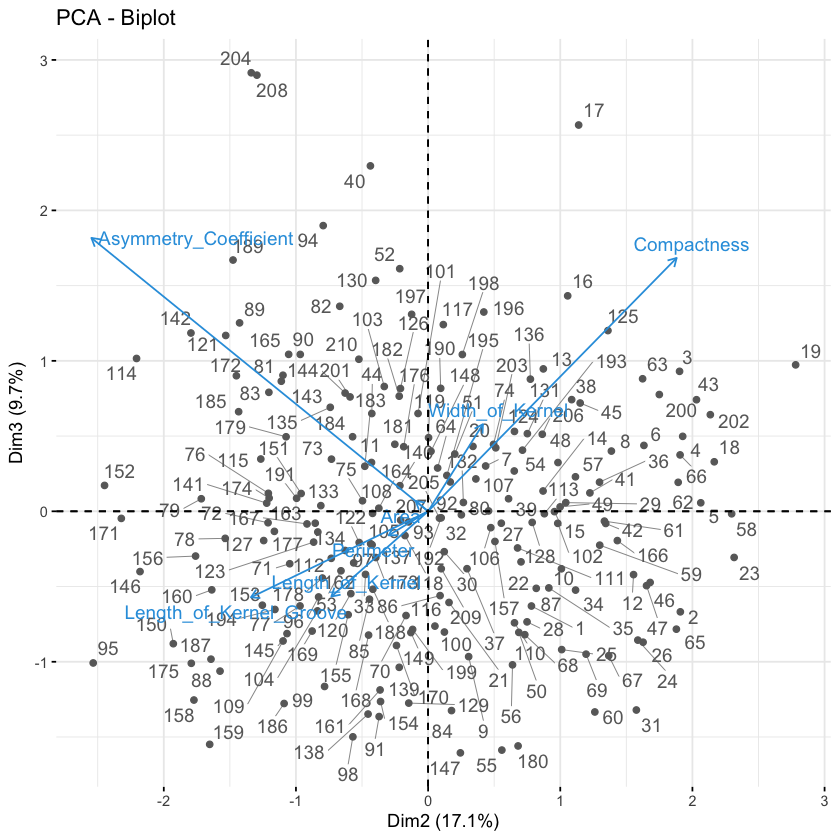

In [37]:
#Biplot of individuals and variables
fviz_pca_biplot(data.pca, repel = TRUE, axes=c(2,3),
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
)

These PCA biplot graphs, similar to the previous ones, show the distribution of variables and individuals on two main components. The length of the variable vectors reflects their contribution to these components, while their directions indicate the relationships between variables. For instance, 'Area' and 'Perimeter' have high contributions to Dim1, whereas 'Asymmetry Coefficient' significantly contributes to Dim2 and Dim3. The individuals (numbers) are distributed in the principal component space, helping to visually identify different groups within the dataset. Particularly distinct individuals indicate that they have significantly different characteristics from the others. These plots are useful for understanding the underlying structure of the dataset and the impact of the variables on the principal components.

In [ ]:
# K-Means

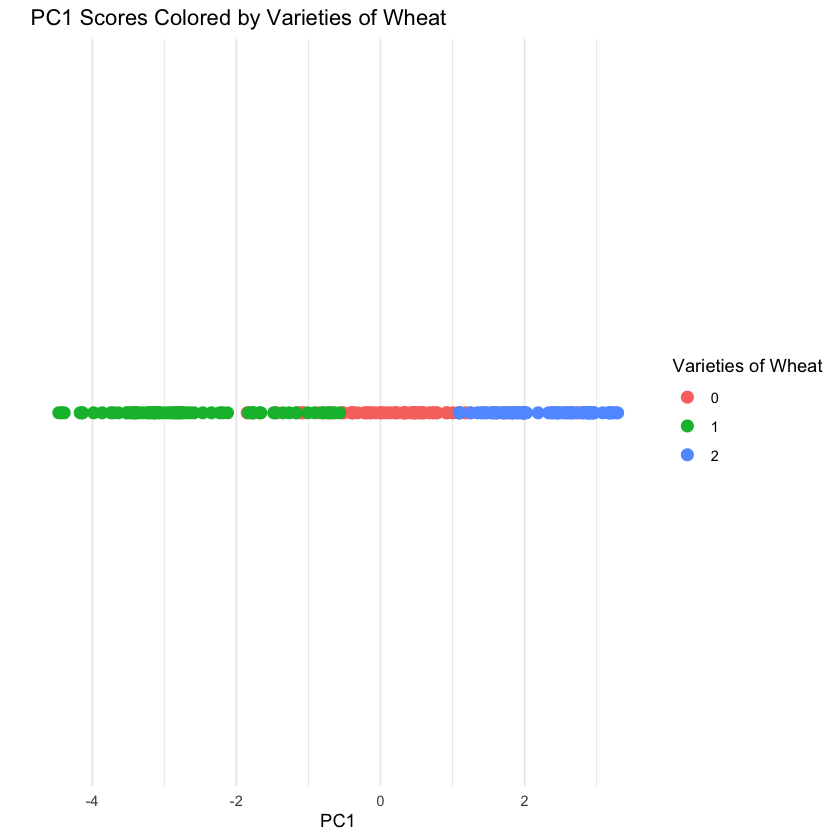

In [38]:
pc1_scores <- data.pca$x[, 1]

df <- data.frame(PC1 = pc1_scores, Varieties_of_Wheat = seeds$Varieties_of_Wheat)

ggplot(df, aes(x = PC1, y = 0, color = Varieties_of_Wheat)) +
  geom_point(size = 3) +
  labs(title = "PC1 Scores Colored by Varieties of Wheat",
       x = "PC1",
       y = "",
       color = "Varieties of Wheat") + # Lejant başlığı ayarla
  scale_y_continuous(limits = c(-1, 1), breaks = NULL) + # Y eksenini ayarla
  theme_minimal()

This graph displays the PC1 scores colored by the different varieties of wheat. From the plot, it is evident that the PC1 component alone can separate the three varieties to a certain extent. Varieties 0, 1, and 2 are mostly distinguishable along the PC1 axis, but there is some overlap between varieties 0 and 1. This suggests that while PC1 captures significant variation in the data, it is not entirely sufficient for perfect separation of all three varieties, indicating that additional principal components or dimensions may be necessary to achieve better clustering.


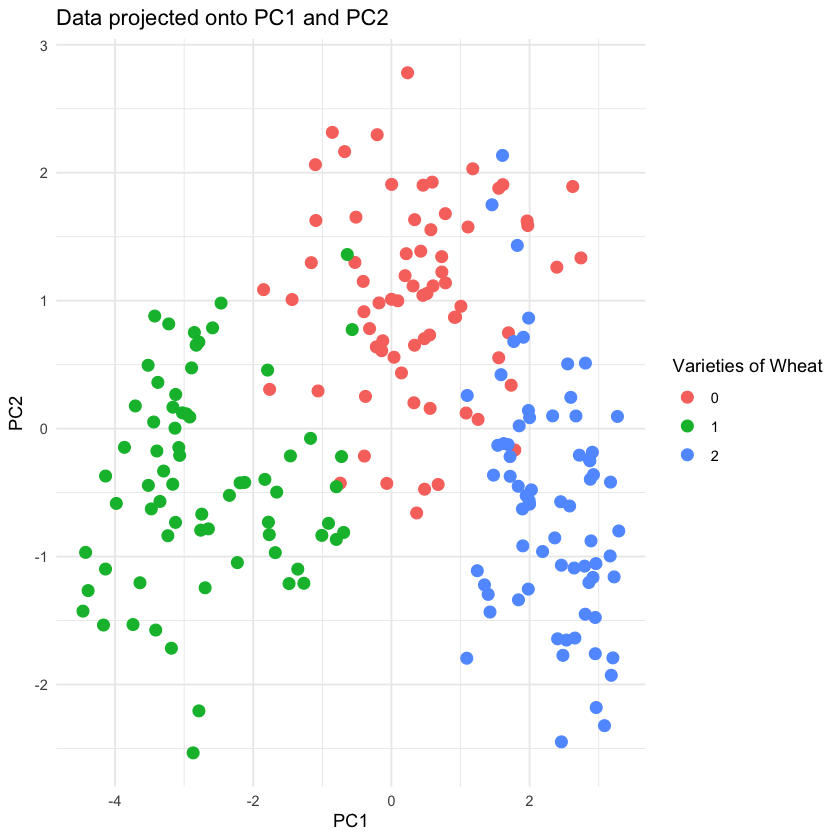

In [39]:
seeds$Varieties_of_Wheat <- factor(seeds$Varieties_of_Wheat)

pca_data <- data.pca$x[, 1:2]  # Select PC1 and PC2

df <- data.frame(PC1 = pca_data[, 1], PC2 = pca_data[, 2], Varieties_of_Wheat = seeds$Varieties_of_Wheat)

ggplot(df, aes(x = PC1, y = PC2, color = Varieties_of_Wheat)) +
  geom_point(size = 3) +
  labs(title = "Data projected onto PC1 and PC2",
       x = "PC1",
       y = "PC2",
       color = "Varieties of Wheat") + # Lejant başlığı ayarla
  theme_minimal()

This scatter plot displays the data projected onto the first two principal components, PC1 and PC2, with points colored according to the varieties of wheat. The plot shows a clearer separation among the three wheat varieties compared to using only PC1. Varieties 0, 1, and 2 form distinct clusters, though there is still some overlap between varieties 0 and 2. This suggests that using both PC1 and PC2 provides a better separation of the data, capturing more of the underlying structure and differences between the wheat varieties.

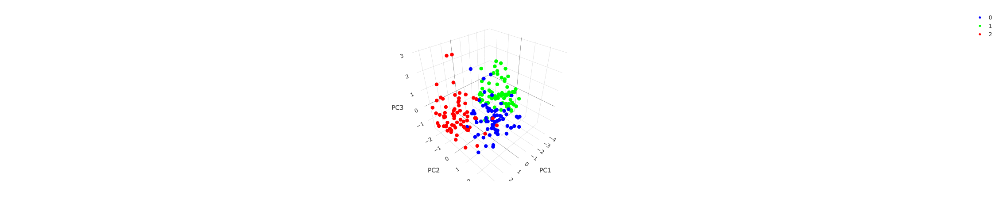

In [40]:
pca_data <- data.pca$x[, 1:3] 

plot_data <- data.frame(PC1 = pca_data[, 1],
                         PC2 = pca_data[, 2],
                         PC3 = pca_data[, 3],
                         Varieties_of_Wheat = seeds$Varieties_of_Wheat)

plot_ly(data = plot_data, 
        x = ~PC1, y = ~PC2, z = ~PC3, 
        color = ~Varieties_of_Wheat, 
        colors = c("blue", "green", "red"), # You can change the colors as desired
        type = "scatter3d", mode = "markers",
        marker = list(size = 5)) %>%
  layout(scene = list(xaxis = list(title = "PC1"),
                      yaxis = list(title = "PC2"),
                      zaxis = list(title = "PC3"),
                      aspectmode = "cube"))


This 3D scatter plot visualizes the data projected onto the first three principal components: PC1, PC2, and PC3. The points are colored according to the varieties of wheat. The addition of the third dimension (PC3) provides further separation of the data, helping to distinguish between the different wheat varieties more effectively. Varieties 0, 1, and 2 are more clearly grouped, with less overlap, indicating that the inclusion of the third principal component enhances the differentiation among the varieties.

# CONCLUSION

[1] "Accuracy Score For Raw Data: 0.89047619047619"


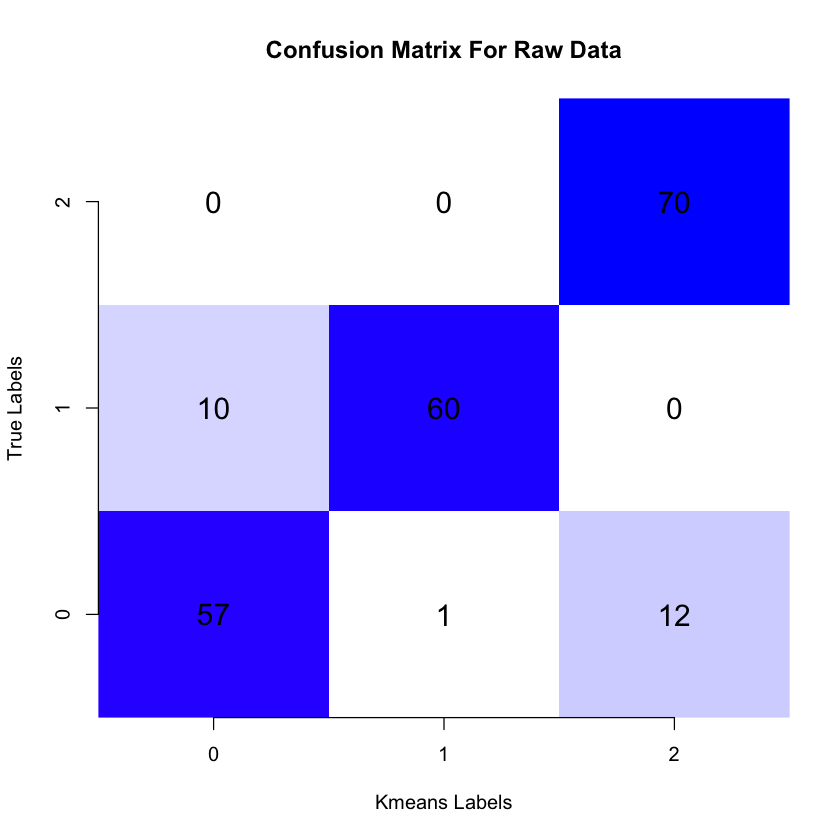

[1] "Accuracy Score for 1 Dimension PCA: 0.857142857142857"


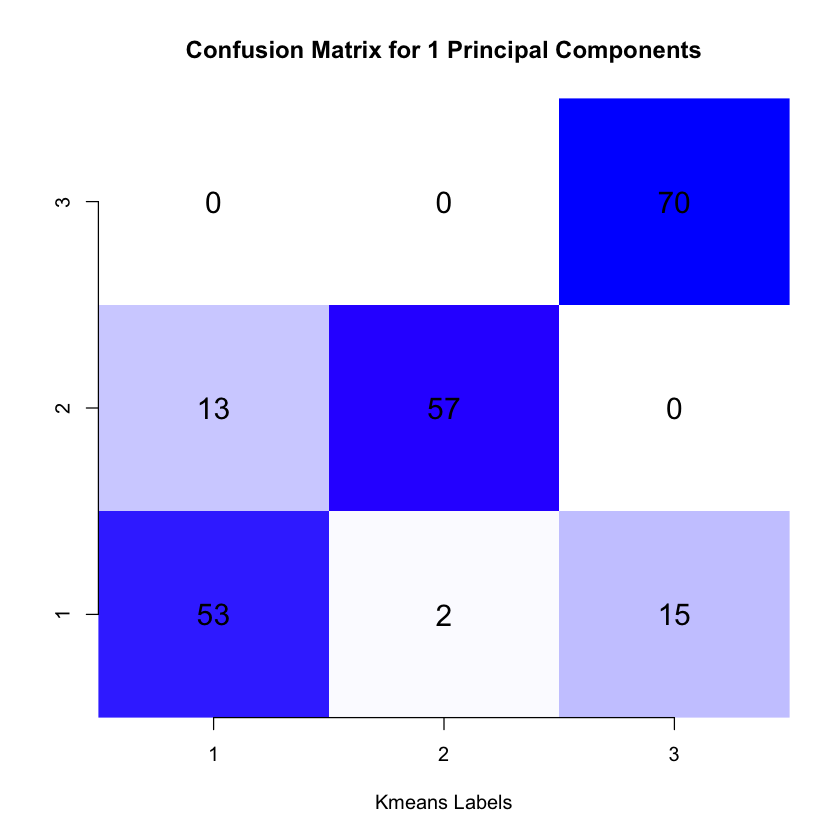

[1] "Accuracy Score for 2 Dimension PCA: 0.923809523809524"


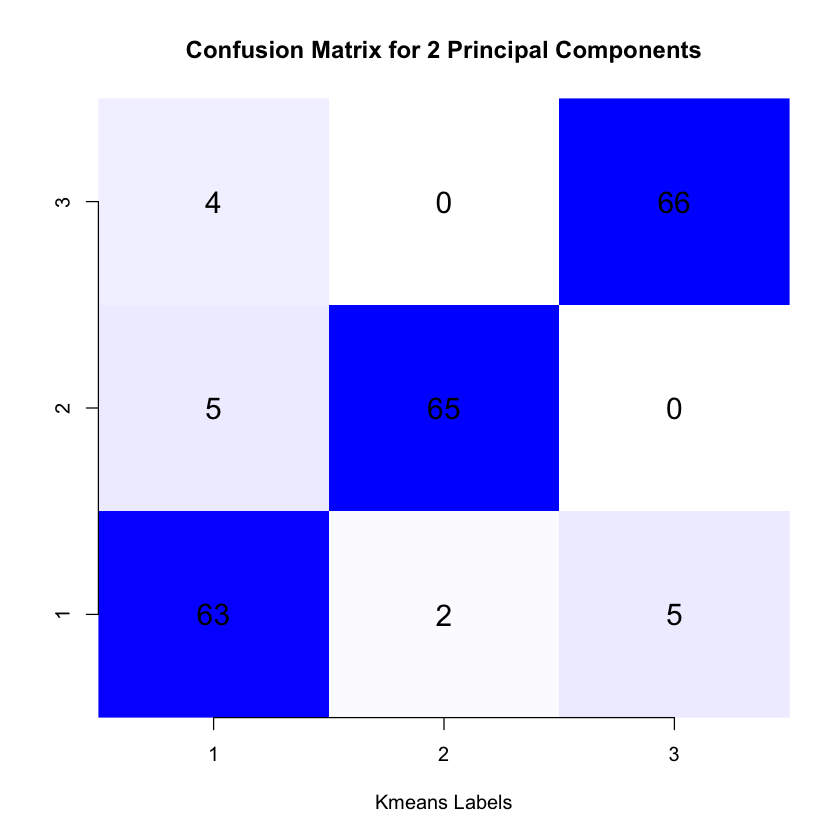

[1] "Accuracy Score for 3 Dimension PCA: 0.90952380952381"


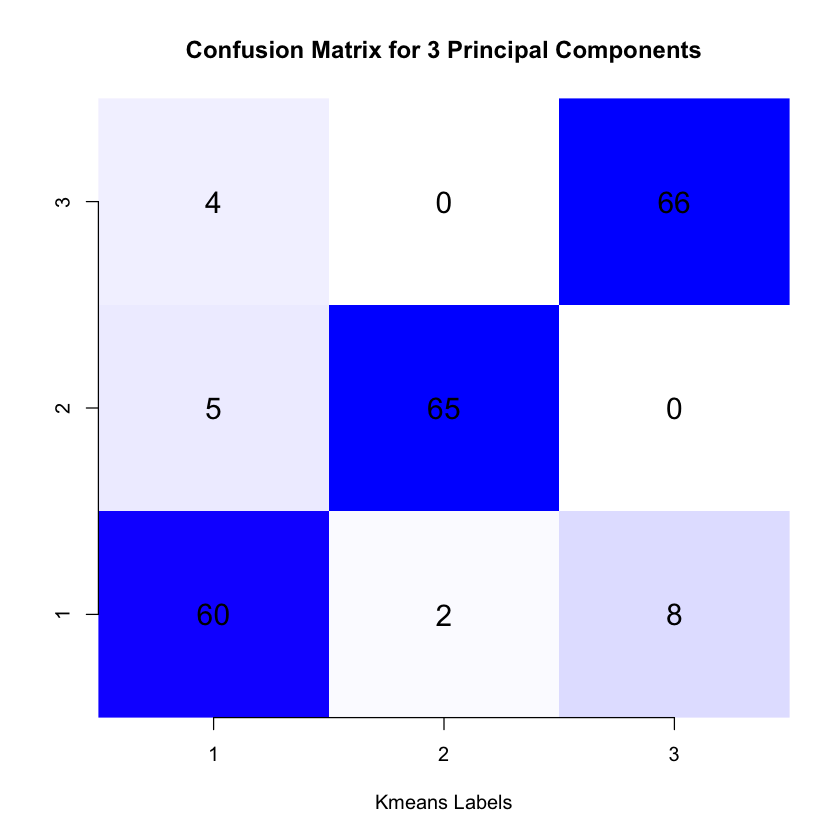

In [41]:
seeds_data <- seeds[, -8]

run_kmeans <- function(data, centers = 3) {
  kmeans_fit <- kmeans(data, centers = centers)
  return(kmeans_fit)
}

seeds_data <- seeds[, -8]

set.seed(100)
kmeans_fit <- run_kmeans(seeds_data, centers = 3)

kmeans_labels <- kmeans_fit$cluster
true_labels <- seeds$Varieties_of_Wheat

matched_labels <- rep(0, length(kmeans_labels))
for (i in 1:3) {
  true_class <- names(sort(table(true_labels[kmeans_labels == i]), decreasing = TRUE))[1]
  matched_labels[kmeans_labels == i] <- true_class
}

confusion_matrix <- table(matched_labels, true_labels)

accuracy <- sum(diag(confusion_matrix)) / sum(confusion_matrix)

print(paste("Accuracy Score For Raw Data:", accuracy))

colors <- colorRampPalette(c("white", "blue"))(max(confusion_matrix))

graph_title <- "Confusion Matrix For Raw Data"

image(1:3, 1:3, confusion_matrix, col = colors, axes = FALSE, 
      xlab = "Kmeans Labels", ylab = "True Labels", main = graph_title, 
      xaxt = "n", yaxt = "n")

axis(1, at = 1:3, labels = rownames(confusion_matrix))
axis(2, at = 1:3, labels = colnames(confusion_matrix))

text(expand.grid(1:3, 1:3), labels = confusion_matrix, cex = 1.5)

for (n in 1:3) {
  pca_data_subset <- pca_data[, 1:n]
  kmeans_fit <- run_kmeans(pca_data_subset)
  
  kmeans_labels <- kmeans_fit$cluster
  true_labels <- seeds$Varieties_of_Wheat
  
  matched_labels <- rep(0, length(kmeans_labels))
  for (i in 1:3) {
    true_class <- names(sort(table(true_labels[kmeans_labels == i]), decreasing = TRUE))[1]
    matched_labels[kmeans_labels == i] <- true_class
  }
  
  confusion_matrix <- table(matched_labels, true_labels)
  
  colors <- colorRampPalette(c("white", "blue"))(max(confusion_matrix))
  
  graph_title <- paste("Confusion Matrix for", n, "Principal Components")
  
  image(1:3, 1:3, confusion_matrix, col = colors, axes = FALSE, xlab = "Kmeans Labels", ylab = "", main = graph_title, xaxt = "n", yaxt = "n")
  
  axis(1, at = 1:3, labels = 1:3)
  axis(2, at = 1:3, labels = 1:3)
  
  text(expand.grid(1:3, 1:3), labels = confusion_matrix, cex = 1.5)  
  
  accuracy <- sum(diag(confusion_matrix)) / sum(confusion_matrix)
  
  print(paste("Accuracy Score for", n, "Dimension PCA:", accuracy))
}

In unsupervised learning, metrics like accuracy are not appropriate since there are no labels to compare predictions against. However, the suitability of two-dimensional PCA has been supported both by statistical criteria and the results obtained from clustering analysis. Based on eigenvalues, it should be noted that the third component does not adequately explain variance, which could lead to erroneous results.

In the clustering analysis using two-dimensional PCA, the accuracy score was calculated as 92.38%. This outperforms raw data (89.05% accuracy) and one-dimensional PCA (85.71% accuracy). Using three-dimensional PCA, the accuracy dropped to 90.95%, indicating that additional components do not always enhance model performance.

Examining the confusion matrix, for label 1, 63 out of 70 instances were correctly predicted, for label 2, 65 out of 70 instances were correct, and for label 3, 66 out of 70 instances were correct. The model struggled slightly more with distinguishing labels 1 and 3, but overall demonstrated high performance. Label 2, in particular, showed strong differentiation with a high accuracy rate.

In conclusion, the clustering analysis using two-dimensional PCA was highly successful and effectively represents the data. With an accuracy score of 92.38%, the model is considered robust and effective. This success supports the applicability and reliability of this method, indicating that analyses conducted with this approach generally yield solid results.